# Part 1. Segmentation — 10 points

### Task

Train a neural network to segment cells edges.

In this task, you won't be provided with any code snippets, just input data and target metric — intersection-over-union (IoU) (see the implementation below).

You should train your neural network to predict a mask of edge pixels (pixels in gt images with value greater than 0).

Use everything you have learnt by now: 
* any architectures for semantic segmentation (encoder-decoder like or based on dilated convolutions), we recommend using UNet: https://towardsdatascience.com/unet-line-by-line-explanation-9b191c76baf5)
* data augmentation (you will need that since train set consists of just 41 images)
* fine-tuning

You are not allowed to do only one thing: to train you network on a test set.

The final solution will consist of an ipython notebook with code (for final network training + any experiments with data) and an archive with png images with network predictions for test images (one-channel images, 0 - for non-edge pixels, any non-zero value for edge pixels).

A good network should be able to segment images with iou >= 0.29. This is not a strict criterion of full points solution, but try to obtain similar or better numbers.

Practical notes:
* There is a hard data class imbalance in dataset, so the network output will be biased toward "zero" class. You can either tune the minimal probability threshold for "edge" class, or add class weights to increase the cost of edge pixels in optimized loss.
* Dataset is small so actively use data augmentation: rotations, flip, random contrast and brightness
* Better spend time on experiments with neural network than on postprocessing tricks (i.e test set augmentation).
* Keep in mind that network architecture defines receptive field of pixel. If the size of network input is smaller than receptive field of output pixel, than probably you can throw some layers without loss of quality. It is ok to modify "of-the-shelf" architectures. 

Good luck!

In [0]:
### Download the dataset ###
!wget https://www.dropbox.com/s/jy34yowcf85ydba/data.zip?dl=0 -O data.zip
!unzip -q data.zip

--2020-05-12 12:06:32--  https://www.dropbox.com/s/jy34yowcf85ydba/data.zip?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.3.1, 2620:100:6016:1::a27d:101
Connecting to www.dropbox.com (www.dropbox.com)|162.125.3.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/jy34yowcf85ydba/data.zip [following]
--2020-05-12 12:06:33--  https://www.dropbox.com/s/raw/jy34yowcf85ydba/data.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucdee13ce1c0c5912ac5213aa310.dl.dropboxusercontent.com/cd/0/inline/A3kaECoEk0ETyTa_Ql9u78_MI_CFGegWDGBH2OoE7_QURCuxLTUNTtA-rLcYZkGnijx4hjAoSgTS-h1NsFn78MfpGZI9lAEYTIRcGY_rHK9SRg/file# [following]
--2020-05-12 12:06:33--  https://ucdee13ce1c0c5912ac5213aa310.dl.dropboxusercontent.com/cd/0/inline/A3kaECoEk0ETyTa_Ql9u78_MI_CFGegWDGBH2OoE7_QURCuxLTUNTtA-rLcYZkGnijx4hjAoSgTS-h1NsFn78MfpGZI9lAEYTIRcGY_rHK9SRg/file
Resolving ucdee13ce1c0c591

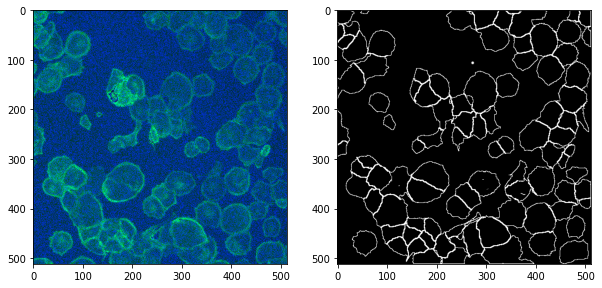

In [0]:
### Visualize the data ###
import matplotlib.pyplot as plt
import numpy as np
import skimage
from skimage import io
%matplotlib inline



# Human HT29 colon-cancer cells
plt.figure(figsize=(10,8))
plt.subplot(1,2,1)
im = skimage.img_as_ubyte(io.imread('BBBC018_v1_images-fixed/train/00735-actin.DIB.bmp'))
plt.imshow(im)
plt.subplot(1,2,2)
mask = skimage.img_as_ubyte(io.imread('BBBC018_v1_outlines/train/00735-cells.png'))
plt.imshow(mask, 'gray')

In [0]:
### Target metric ###
def calc_iou(prediction, ground_truth):
    n_images = len(prediction)
    intersection, union = 0, 0
    for i in range(n_images):
        intersection += np.logical_and(prediction[i] > 0, ground_truth[i] > 0).astype(np.float32).sum() 
        union += np.logical_or(prediction[i] > 0, ground_truth[i] > 0).astype(np.float32).sum()
    return float(intersection) / union

In [0]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as torch_data

import torchvision
import torchvision.transforms as transforms

import os
import random
from PIL import Image

In [0]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

GPU 0: Tesla P100-PCIE-16GB (UUID: GPU-2a4ea42c-10c1-9407-3eff-d38325a5bd79)


In [0]:
class UNetConv2d(nn.Module):

    def __init__(self, in_channels, out_channels, activation):
        super(UNetConv2d, self).__init__()

        if activation == 'relu':
            self.activation = nn.ReLU()
        elif activation == 'leaky_relu':
            self.activation = nn.LeakyReLU(0.1)
        
        self.conv = nn.Sequential(
                                  nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
                                  nn.InstanceNorm2d(out_channels),
                                  self.activation
                                 )
        
    def forward(self, x):
        x = self.conv(x)
        return x

class UNetDownsampling(nn.Module):

    def __init__(self, in_channels, num_filters, activation):
        super(UNetDownsampling, self).__init__()

        self.downsample = nn.MaxPool2d(kernel_size=(2, 2), stride=2)

        self.conv_block = nn.Sequential( 
                                        UNetConv2d(in_channels, num_filters, activation),
                                        UNetConv2d(num_filters, num_filters, activation)
                                       )
    
    def forward(self, x):
        x = self.downsample(x)
        x = self.conv_block(x)
        return x

class UNetUpsampling(nn.Module):

    def __init__(self, in_channels, num_filters, activation):
        super(UNetUpsampling, self).__init__()
        
        self.upsample = nn.ConvTranspose2d(in_channels, num_filters, kernel_size=2, stride=2)
        
        self.conv_block = nn.Sequential(
                                        UNetConv2d(in_channels, num_filters, activation),
                                        UNetConv2d(num_filters, num_filters, activation)
                                       )
    
    def forward(self, x, x_prev):
        x = self.upsample(x)
        x = torch.cat((x, x_prev), dim=1)
        x = self.conv_block(x)
        return x

class UNet(nn.Module):

    def __init__(self, in_channels, out_channels, num_filters=[64,128,256,512,1024], activation='relu', sigmoid=True):
        super(UNet, self).__init__()

        self.num_layers = len(num_filters)

        self.input_layer = nn.Sequential(
                                         UNetConv2d(in_channels, num_filters[0], activation),
                                         UNetConv2d(num_filters[0], num_filters[0], activation)
                                        )
        
        self.downsample = nn.ModuleList( 
                                        [UNetDownsampling(num_filters[i-1], num_filters[i], activation) for i in range(1, self.num_layers)]
                                       )
        
        self.upsample   = nn.ModuleList( 
                                        [UNetUpsampling(num_filters[i], num_filters[i-1], activation) for i in range(self.num_layers-1,0,-1)]
                                       )
        
        if sigmoid:
            self.output_layer = nn.Sequential(
                                              nn.Conv2d(num_filters[0], out_channels, kernel_size=1),
                                              nn.Sigmoid()
                                             )
        else:
            self.output_layer = nn.Conv2d(num_filters[0], out_channels, kernel_size=1)

    def forward(self, x):
        x_in = self.input_layer(x)

        x_ds = [x_in]
        for i in range(self.num_layers-1):
            x_ds.append(self.downsample[i](x_ds[-1]))
        
        x_us = x_ds[-1]
        for i in range(self.num_layers-1):
            x_us = self.upsample[i](x_us, x_ds[-(i+2)])

        x = self.output_layer(x_us)
        return x

In [0]:
class ImageDataset(torch_data.Dataset):

    def __init__(self, image_path, outline_path, seed=None, img_transform=None, tgt_transform=None):
        super(ImageDataset, self).__init__()

        self.images_list   = sorted(os.listdir(image_path))
        self.outlines_list = sorted(os.listdir(outline_path))
        self.img_transform = img_transform
        self.tgt_transform = tgt_transform
        self.image_path    = image_path
        self.outline_path  = outline_path

        if seed is None:
            self.seed = torch.randint(0, torch.iinfo(torch.int32).max, (1,), dtype=torch.int32).item()
        else:
            self.seed = seed
        self.rand_gen = torch.Generator().manual_seed(self.seed)

    def __len__(self):
        return len(self.images_list)

    def __getitem__(self, idx):
        """
        https://stackoverflow.com/questions/59516181/fix-random-seed-for-torchvision-transforms
        """
        loc_seed = torch.randint(0, torch.iinfo(torch.int32).max, (1,), dtype=torch.int32, generator=self.rand_gen).item()

        image = Image.open(self.image_path + self.images_list[idx])
        random.seed(loc_seed)
        if self.img_transform:
            image = self.img_transform(image)

        outline = Image.open(self.outline_path + self.outlines_list[idx])
        random.seed(loc_seed)
        if self.tgt_transform:
            outline = self.tgt_transform(outline)
        
        return image, outline

In [0]:
train_transform = transforms.Compose([
                                      transforms.RandomHorizontalFlip(),
                                      transforms.RandomVerticalFlip(),
                                      transforms.RandomAffine(degrees=15),
                                      transforms.ColorJitter(contrast=(0.25, 1.25), brightness=(0.25, 1.25)),
                                      transforms.ToTensor()
                                    ])

train_transform_tgt = transforms.Compose([
                                          transforms.RandomHorizontalFlip(),
                                          transforms.RandomVerticalFlip(),
                                          transforms.RandomAffine(degrees=15),
                                          transforms.ToTensor()
                                        ])

val_transform = transforms.Compose([transforms.ToTensor()])

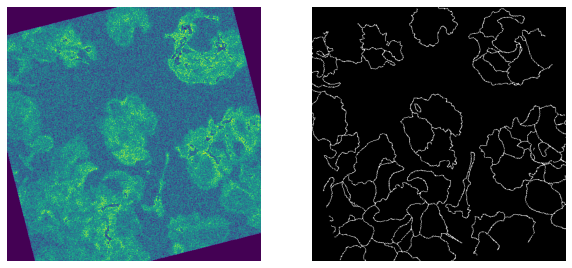

In [0]:
# Test dataset
train_dset = ImageDataset('./BBBC018_v1_images-fixed/train/', './BBBC018_v1_outlines/train/',\
                          img_transform=train_transform, tgt_transform=train_transform_tgt)

idx = torch.randint(0, train_dset.__len__(), (1,)).item()
image, outline = train_dset[idx]

plt.figure(figsize=(10,8))
plt.subplot(1, 2, 1)
image = image[0,:,:].numpy() + image[1,:,:].numpy() + image[2,:,:].numpy()
plt.imshow(image)
plt.axis('off')

plt.subplot(1, 2, 2)
outline = outline[0,:,:].numpy()
plt.imshow(outline, cmap='gray')
plt.axis('off')

plt.show()

In [0]:
# Calculate how many edge pixels there are on average for the non-transformed images
dummy_dset = ImageDataset('./BBBC018_v1_images-fixed/train/', './BBBC018_v1_outlines/train/', seed=0,\
                          img_transform=val_transform, tgt_transform=val_transform)

edge_pixels = 0
for i in np.arange(dummy_dset.__len__()):
    _, outline   = dummy_dset[i]
    edge_pixels += (outline[0,:,:].numpy() > 0.1).sum()
edge_pixels = edge_pixels // dummy_dset.__len__()
total_pixels = 512 * 512

print("Edge pixels on average:", edge_pixels)
print("Edge pixel percentage on average:", edge_pixels / total_pixels * 100, "%")

Edge pixels on average: 10217
Edge pixel percentage on average: 3.8974761962890625 %


In [0]:
def fix_seed(seed=0, device=device):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if device.type == 'cuda':
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

In [0]:
from IPython import display
import time

def train(net, n_epochs, optimizer, criterion, train_loader, val_loader, device,\
          scheduler=None, early_stop=None, verbose=True, save_dir=None):
    
    train_loss_hist, val_loss_hist = [], []

    start = time.time()
    for epoch in range(1, n_epochs+1):
        train_loss, val_loss = 0.0, 0.0

        # training
        net.train()
        for X, y in train_loader:
            # send data to device
            X, y = X.to(device), y.to(device)

            # make prediction and calculate loss
            y_pred = net(X)
            loss   = criterion(y_pred.view(-1), y.view(-1))
            train_loss += loss.item()

            # update model weights
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            del loss
        train_loss /= len(train_loader)
        train_loss_hist.append(train_loss)

        # validation
        net.eval()
        for X, y in val_loader:
            X, y = X.to(device), y.to(device)

            y_pred = net(X)
            val_loss += criterion(y_pred, y).item()
        val_loss /= len(val_loader)
        val_loss_hist.append(val_loss)

        if scheduler is not None:
            scheduler.step(val_loss)
        
        if early_stop is not None:
            early_stop.step()

        if verbose:
            display.clear_output(wait=True)
            plt.plot(train_loss_hist, label='train loss')
            plt.plot(val_loss_hist, label='val loss')
            plt.xlabel("Epoch")
            plt.ylabel("Loss")
            plt.title("Loss history")
            plt.legend()

            plt.show()
    
    print("Elapsed time:", time.time() - start, "s")
    if save_dir is not None:
        torch.save(net.state_dict(), save_dir)

In [0]:
DO_TRAIN = True

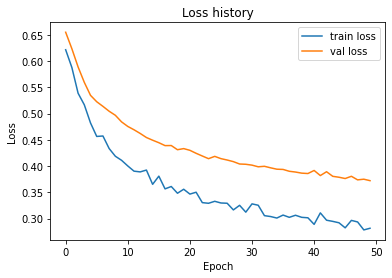

Elapsed time: 438.26157784461975 s


In [0]:
if DO_TRAIN:
    seed = 0
    
    fix_seed(seed, device)

    train_dset = ImageDataset('./BBBC018_v1_images-fixed/train/', './BBBC018_v1_outlines/train/', seed=seed,\
                              img_transform=train_transform, tgt_transform=train_transform_tgt)
    val_dset   = ImageDataset('./BBBC018_v1_images-fixed/val/', './BBBC018_v1_outlines/val/', seed=seed,\
                              img_transform=val_transform, tgt_transform=val_transform)
    im_channels, num_classes = 3, 1

    # classic UNet without sigmoid, because I use BCEWithLogits as a loss function and it already contains sigmoid
    net = UNet(im_channels, num_classes, sigmoid=False)

    # 5 was found experimentally via several runs, because simply using 25 (because we have ~4% of positive labels compared to negatives)
    # provided bad and unstable results
    criterion = nn.BCEWithLogitsLoss(pos_weight=torch.tensor(5.0).to(device))
    optimizer = torch.optim.Adam(net.parameters(), lr=1e-4, weight_decay=1e-4)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=5, threshold=0.01, verbose=True)

    batch_size   = 4
    train_loader = torch_data.DataLoader(train_dset, batch_size, shuffle=True)
    val_loader   = torch_data.DataLoader(val_dset, batch_size, shuffle=False)

    net.to(device)
    train(net, 50, optimizer, criterion, train_loader, val_loader, device, scheduler=scheduler, save_dir='part1_cp.pth')

In [0]:
def validate_IOU(net, val_loader, device, threshold=0.5):
    net.eval()

    predictions, real_masks = [], []
    for X, y in val_loader:
        X, y = X.to(device), y.to(device)

        logits_pred = net(X)
        predictions.append((logits_pred.detach().sigmoid() > threshold).cpu().numpy())
        real_masks.append(y.cpu().numpy())

    predictions, real_masks = np.concatenate(predictions), np.concatenate(real_masks)
    return calc_iou(predictions, real_masks)

def gridsearch_threshold(net, val_loader, device):
    thresholds = np.linspace(0, 1, 51)
    ious = []
    for i in range(51):
        ious.append(validate_IOU(net, val_loader, device, thresholds[i]))
    
    plt.figure(figsize=(15,8))
    plt.plot(thresholds, ious, c='red', marker='o')
    plt.title('IoU vs threshold')
    plt.xlabel('Threshold')
    plt.ylabel('IoU')
    plt.grid()
    plt.show()

    best_id = np.argmax(np.array(ious))
    print("Best threshold:", thresholds[best_id])
    print("Best IoU:", ious[best_id])

    return thresholds[best_id]

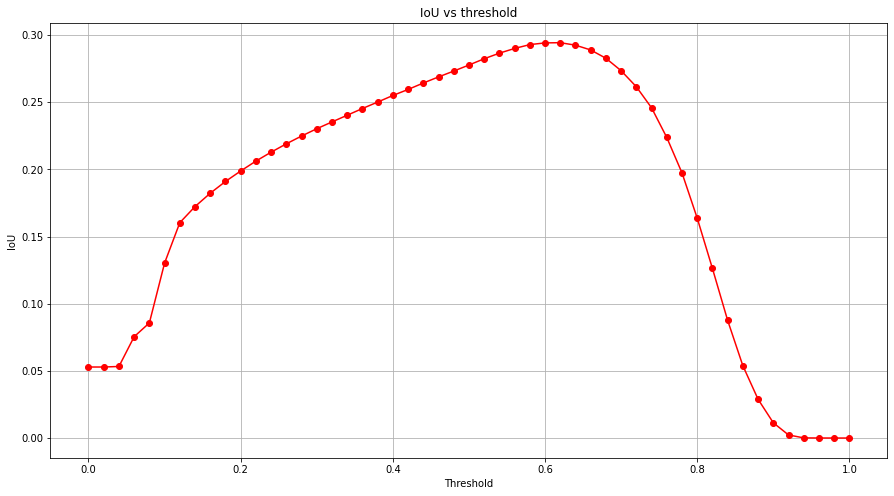

Best threshold: 0.62
Best IoU: 0.29426614170641285


In [0]:
threshold = gridsearch_threshold(net, val_loader, device)

In [0]:
def test(net, threshold):
    net.eval()
    path = sorted(os.listdir('./BBBC018_v1_images-fixed/test/'))
    for item in path:
        if item != '.ipynb_checkpoints':
            image = Image.open('./BBBC018_v1_images-fixed/test/' + item)
            image_tensor = torchvision.transforms.ToTensor()(image).view(1,3,512,512)

            outline_pred = net(image_tensor.cuda()).cpu().view(1,512,512)
            outline_pred = torchvision.transforms.ToPILImage()((outline_pred > threshold).float())
            outline_pred.save('./BBBC018_v1_outlines/' + item[:6] + 'cells.png')

In [0]:
net = UNet(im_channels, num_classes, sigmoid=False)
net.load_state_dict(torch.load('part1_cp.pth', map_location='cpu'))
net.to(device)
test(net, threshold)

['.ipynb_checkpoints', '00733-actin.DIB.bmp', '05624-actin.DIB.bmp', '05899-actin.DIB.bmp', '10780-actin.DIB.bmp', '13361-actin.DIB.bmp', '13569-actin.DIB.bmp', '19466-actin.DIB.bmp']


Text(0.5, 1.0, 'Predicted outline')

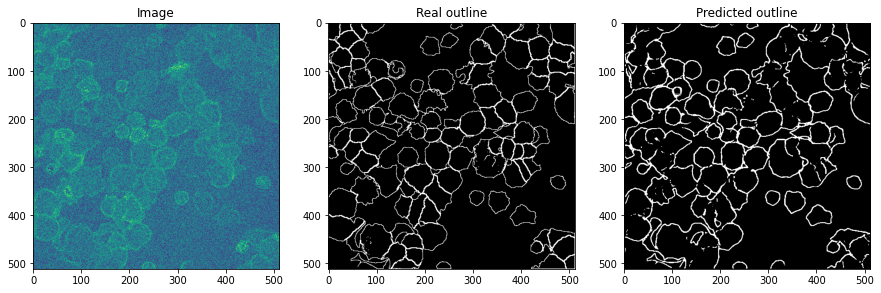

In [0]:
# Validation
plt.figure(figsize=(15,12))

plt.subplot(1,3,1)
image, outline = val_dset[0]
image = image[0,:,:].numpy() + image[1,:,:].numpy() + image[2,:,:].numpy()
plt.imshow(image)
plt.title("Image")

plt.subplot(1,3,2)
plt.imshow(outline[0,:,:].numpy(), 'gray')
plt.title("Real outline")

plt.subplot(1,3,3)
outline_pred = (net(val_dset[0][0].view(1, 3, 512, 512).cuda()) > 0.65).float()
plt.imshow(outline_pred[0,0,:,:].cpu().numpy(), 'gray')
plt.title("Predicted outline")

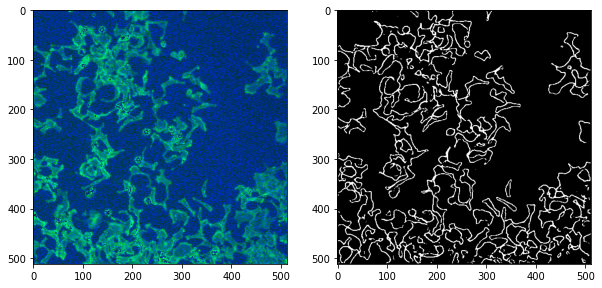

In [0]:
# Test
plt.figure(figsize=(10,8))

plt.subplot(1,2,1)
im = skimage.img_as_ubyte(io.imread('BBBC018_v1_images-fixed/test/05624-actin.DIB.bmp'))
plt.imshow(im)

plt.subplot(1,2,2)
mask = skimage.img_as_ubyte(io.imread('BBBC018_v1_outlines/05624-cells.png'))
plt.imshow(mask, 'gray')

# Part 2. Deep Image Prior (DIP) — 10 points


### Theory

Deep Image Prior [1] can be viewed as an implicit conditional generative model:

\begin{equation}
p(x \mid x_0) = \int p(x \mid \theta, \mathcal{z}, x_0)\, p(\theta \mid x_0)\, p(\mathcal{z})\,d\theta\,d\mathcal{z}\,,
\end{equation}

Latent parameters of this model consist of the weights of the neural network $\theta$ and a fixed input $\mathcal{z}$, which is fed into the network. 

If we denote the network by $f$, the output $x$ is produced in the following way:

$$
x = f_\theta(\mathcal{z}).
$$

This this model is implicit: we cannot evaluate the integral above. In the case of DIP, both likelihood and prior are unknown. But, as with all implicit models, we can perform sampling from $p(x \mid x_0)$.

Similarly to style transfer models, the sampling is done via optimization. The algorithm is following:

1. Sample a data point $x_0$ from a data distribution.
2. Initialize $\theta$ with $\theta_0$ and $\mathcal{z}$ with $z$.
3. Perform an optimization of some error function $E$ with respect to the weights of the neural network: 

$$
\min_\theta E(f_\theta(z), x_0).
$$

4. Hand-pick the weights $\theta_M$ at intermediate optimization step $M$ and denote them as $\theta^*$

Now, the most counter-intuitive thing about this model is the fact that it can be used for image restoration (inpainting, denoising) and super-resolution. In this case, $x_0$ is a degraded version of a target image $x$. And, by trying to predict this degraded image using a network (via minimization of an error between the predicted image $f_\theta(z)$ and $x_0$) at some optimization step $M$ we will obtain its restored or upscaled version.

The main trick is that instead of optimizing with respect to an input tensor $z$, like in style-transfer models, we keep the input fixed and optimize with repect to the weights of the network. Brief explanation of this result is provided below, for more details please refer to [1].

On one hand, a convolutional neural network is close to a universal functional approximator, and, given enough training iterations, it can fit a manifold of arbitrary complexity [2]. On the other hand, it is observed in practice that early stopping leads to solutions with good generalization (same networks, as in [2], can be properly trained to achieve good generalization). In DIP paper this phenomena is explored for image synthesis, and it was shown that the same intuition about generalization also applies here. Remarkably though, the generalization results were obtained for a highly complex manifold of natural images, which once again shows how well-suited are convolutional neural networks for image processing and synthesis.

### Task

The general goal of the task is for you to reproduce the results from the paper:

using a Mean Square Error (MSE) as an error function,

1. perform denoising of the images in the folder "data/denoising",
2. perform inpaiting of the images in the folder "data/inpaiting" (for inpainting, apply the loss only over the known area of the image using a provided mask),

with a UNet-style network (with 4 downsampling layers, and 16, 32, 64 and 128 filters at the end of each block).

For architecture reference, please read this blog post:
https://towardsdatascience.com/unet-line-by-line-explanation-9b191c76baf5.

If you have used a UNet-style network in the first part of the assignment on segmentation, you can reuse the code.

### Notes

- You have to play with the number of iterations $M$ used for early stopping, and use the optimal value to denoise and inpaint the images from the task. For each task you may need to find different optimal values. The source code and the results of your experiments should be provided in this notebook.
- Use Adam as your default optimizer, but feel free to experiment with the other optimizers or even architectures of the network. The most thorough experiments will be graded with bonus points. The final score for the homework is calculated as $\min ( \text{points} + \text{bonus_points}, \text{max_points} ) $.

### References

[1] Ulyanov et. al., "Deep Image Prior", CVPR 2018, https://arxiv.org/abs/1711.10925

[2] Zhang et. al., "Understanding deep learning requires rethinking generalization", ICLR 2017, https://arxiv.org/abs/1611.03530

In [0]:
### Download the dataset ###
!wget https://www.dropbox.com/s/si5o4dp4qa59cyy/data.zip?dl=0 -O data.zip
!unzip -q data.zip

--2020-05-12 13:45:31--  https://www.dropbox.com/s/si5o4dp4qa59cyy/data.zip?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.1.1, 2620:100:6016:1::a27d:101
Connecting to www.dropbox.com (www.dropbox.com)|162.125.1.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/si5o4dp4qa59cyy/data.zip [following]
--2020-05-12 13:45:31--  https://www.dropbox.com/s/raw/si5o4dp4qa59cyy/data.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucd0398257c0de6afb4162789bbd.dl.dropboxusercontent.com/cd/0/inline/A3mqdD2Xoou5Kg1vTKrXUggboaHRhpAVbahW3iwMd3jJ5hReLjI2V6o-YjSR07NT-g4mvaepcNAeW8heuUjkMBCTE0p_Nn6_QsChEcCmWk02y5MdGG1SfGG7r0n7FvkCwKI/file# [following]
--2020-05-12 13:45:31--  https://ucd0398257c0de6afb4162789bbd.dl.dropboxusercontent.com/cd/0/inline/A3mqdD2Xoou5Kg1vTKrXUggboaHRhpAVbahW3iwMd3jJ5hReLjI2V6o-YjSR07NT-g4mvaepcNAeW8heuUjkMBCTE0p_Nn6_QsChEcCmWk02y5MdGG1SfGG7r

In [0]:
import matplotlib.pyplot as plt
import numpy as np
import skimage
from skimage import io
%matplotlib inline

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as torch_data

import torchvision
import torchvision.transforms as transforms

import os
import random
from PIL import Image

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

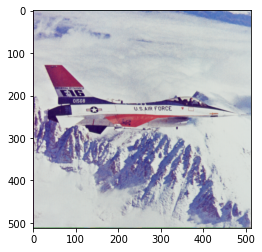

In [0]:
# test image
f16_img = np.array(Image.open('./data/denoising/F16_GT.png'))
plt.imshow(f16_img)

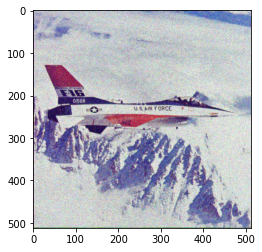

In [0]:
# add noise to F16 image, because it looks clear
f16_noisy = Image.fromarray(np.clip(f16_img + np.random.normal(scale=25, size=f16_img.shape), 0, 255).astype(np.uint8))
plt.imshow(f16_noisy)

In [0]:
import time

def DIP_denoise(img_noisy, device, noise_ch=32, max_iter=1000, alpha=None, verbose=False, freq=None):
    if verbose and freq is None:
        freq = max(1, max_iter // 10)
    denoise_net = UNet(noise_ch, out_channels=3, num_filters=[8,16,32,64,128], activation='leaky_relu', sigmoid=True)
    denoise_net.to(device)

    loss_function = nn.MSELoss()
    optimizer = torch.optim.Adam(denoise_net.parameters(), lr=1e-2)

    noisy_image = torchvision.transforms.ToTensor()(img_noisy).to(torch.float32).unsqueeze(0).to(device)
    maxmin = noisy_image.max() - noisy_image.min()

    # sample noise from U(0, 1/10)
    noise = torch.rand((1, noise_ch, noisy_image.size(2), noisy_image.size(3)), device=device) * 1.0 / 10.0
    perturbation = noise.clone()

    out_avg = None
    loss_history = []

    time_start = time.time()
    denoise_net.train()
    for i in range(max_iter):
        # sample additional perturbation from N(0, 1/30)
        net_input = noise + (perturbation.normal_() * 1.0 / 30.0)
        net_out   = denoise_net(net_input)

        # exponential smoothing, improves the results a bit as was mentioned by authors
        if out_avg is None:
            out_avg = net_out.detach()
        else:
            out_avg = out_avg * alpha + net_out.detach() * (1.0 - alpha)

        optimizer.zero_grad()
        loss = loss_function(net_out, noisy_image)
        loss.backward()
        optimizer.step()
        
        loss_history.append(loss.item())
        PSNR = 10 * torch.log10(maxmin ** 2.0 / loss_function(noisy_image, out_avg))
        
        if verbose and i % freq == 0:
            dip_PIL = torchvision.transforms.ToPILImage()(out_avg.squeeze(0).cpu())
            plt.imshow(dip_PIL)
            plt.show()
    print("Elapsed time:", time.time() - time_start, "s")

    return out_avg.squeeze(0).cpu(), PSNR.cpu().item(), loss_history

In [0]:
def f16_print(f16_noisy, f16_dip, f16_PSNR, f16_img):
    plt.figure(figsize=(15,12))

    plt.subplot(1,3,1)
    plt.imshow(f16_noisy)
    plt.title("Noisy image")

    f16_dip_PIL = torchvision.transforms.ToPILImage()(f16_dip)
    plt.subplot(1,3,2)
    plt.imshow(f16_dip_PIL)
    plt.title("DIP reconstruction")

    plt.subplot(1,3,3)
    plt.imshow(f16_img)
    plt.title("Original image")

    plt.show()

    plt.figure(figsize=(10,8))

    plt.subplot(2,3,1)
    plt.imshow(np.array(f16_noisy)[200:300, 200:400])
    plt.title("Noisy image")

    plt.subplot(2,3,4)
    plt.imshow(np.array(f16_noisy)[100:250, 20:150])

    plt.subplot(2,3,2)
    plt.imshow(np.array(f16_dip_PIL)[200:300, 200:400])
    plt.title("DIP reconstruction")

    plt.subplot(2,3,5)
    plt.imshow(np.array(f16_dip_PIL)[100:250, 20:150])

    plt.subplot(2,3,3)
    plt.imshow(np.array(f16_img)[200:300, 200:400])
    plt.title("Original image")

    plt.subplot(2,3,6)
    plt.imshow(np.array(f16_img)[100:250, 20:150])

    plt.show()

    print("PSNR dip:", f16_PSNR)

In [0]:
# start with big N
f16_dip, f16_PSNR, f16_loss = DIP_denoise(f16_noisy, device, max_iter=10000, alpha=0.95, verbose=False, freq=500)

Elapsed time: 207.8387131690979 s


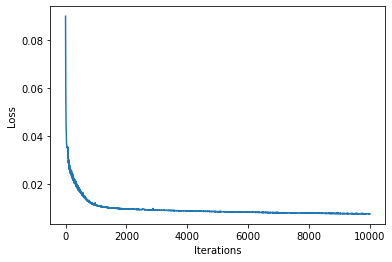

PSNR: 21.27110481262207


In [0]:
plt.plot(f16_loss)
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()
print("PSNR:", f16_PSNR)

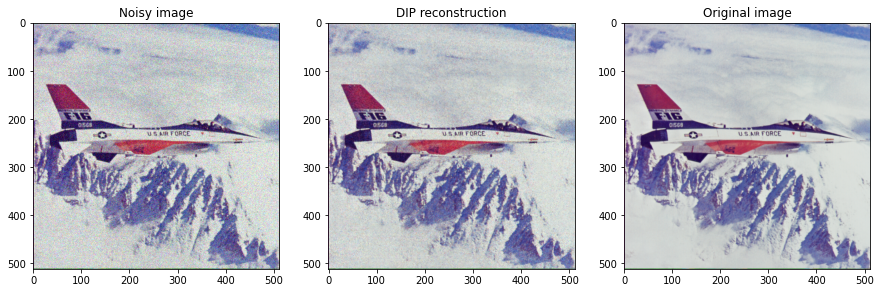

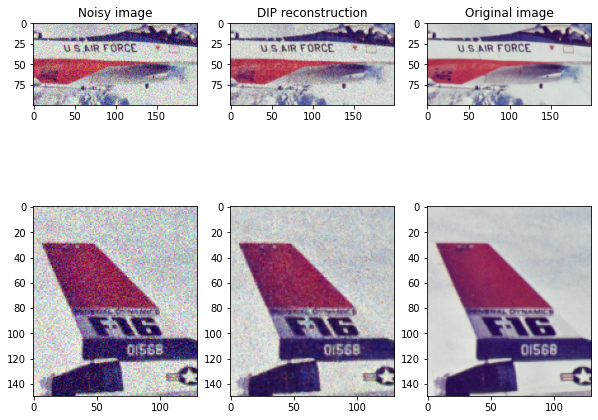

PSNR dip: 21.27110481262207


In [0]:
f16_print(f16_noisy, f16_dip, f16_PSNR, f16_img)

We can see that loss stops improving significantly at around 2000 iterations and we see that the second picture looks overfitted and noisy. Let's try less iterations - 3000, giving enough iterations for loss to stabilize fully.

Elapsed time: 62.44640016555786 s


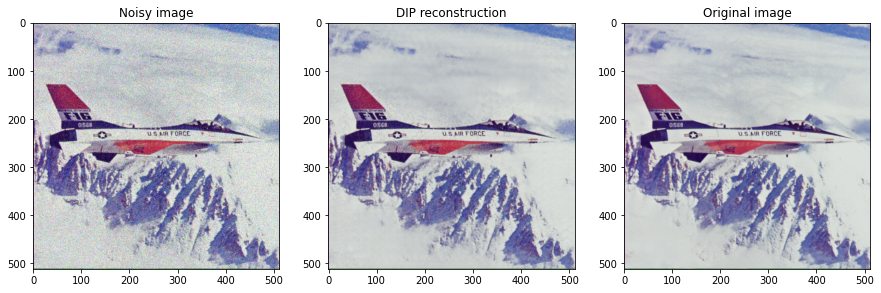

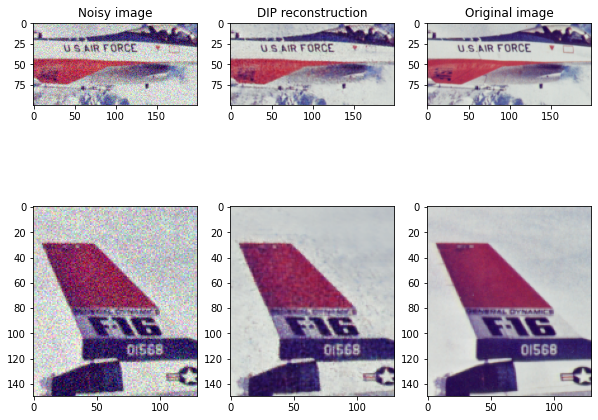

PSNR dip: 20.534303665161133


In [0]:
f16_dip, f16_PSNR, f16_loss = DIP_denoise(f16_noisy, device, max_iter=3000, alpha=0.95, verbose=False, freq=500)
f16_print(f16_noisy, f16_dip, f16_PSNR, f16_img)

The overfitting issue is solved there and it can be seen that the resulting picture is less noisy, while not being oversmoothed - most of the fine details are well-defined, except the small text above F-16 on the rear end of the jet.

Cropped size: (384, 256)


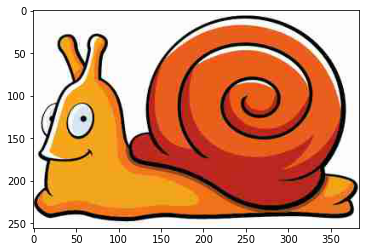

In [0]:
snail_img = Image.open('./data/denoising/snail.jpg')
bounding_box = (
                (snail_img.size[0] - (snail_img.size[0] - snail_img.size[0] % 32)) // 2,
                (snail_img.size[1] - (snail_img.size[1] - snail_img.size[1] % 32)) // 2,
                (snail_img.size[0] + (snail_img.size[0] - snail_img.size[0] % 32)) // 2,
                (snail_img.size[1] + (snail_img.size[1] - snail_img.size[1] % 32)) // 2
               )

# crop image so that network functions correctly
snail_img = snail_img.crop(bounding_box)
plt.imshow(snail_img)
print("Cropped size:", snail_img.size)

In [0]:
def snail_print(snail_img, snail_dip, snail_PSNR):
    plt.figure(figsize=(10,8))

    plt.subplot(1,2,1)
    plt.imshow(snail_img)
    plt.title("Original image")

    snail_dip_PIL = torchvision.transforms.ToPILImage()(snail_dip.squeeze(0))
    plt.subplot(1,2,2)
    plt.imshow(snail_dip_PIL)
    plt.title("DIP reconstruction")

    plt.show()

    plt.figure(figsize=(5,4))

    plt.subplot(2,2,1)
    plt.imshow(np.array(snail_img)[120:200, 100:200])
    plt.title("Original image")

    plt.subplot(2,2,3)
    plt.imshow(np.array(snail_img)[30:80, 300:380])

    plt.subplot(2,2,2)
    plt.imshow(np.array(snail_dip_PIL)[120:200, 100:200])
    plt.title("DIP reconstruction")

    plt.subplot(2,2,4)
    plt.imshow(np.array(snail_dip_PIL)[30:80, 300:380])

    plt.show()

    print("PSNR dip:", snail_PSNR)

Elapsed time: 126.50678372383118 s


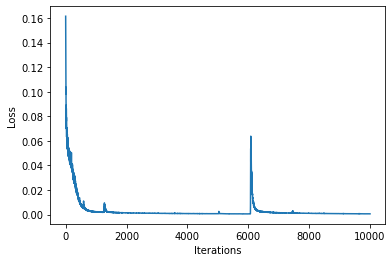

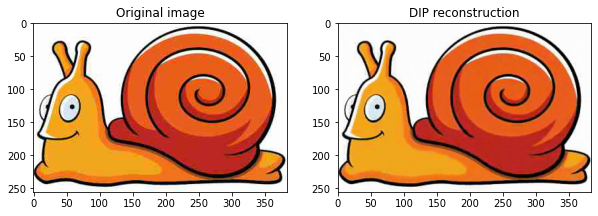

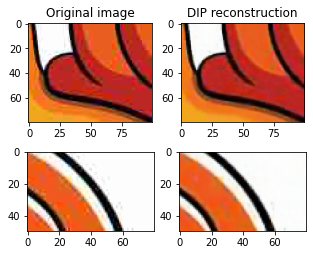

PSNR dip: 32.492584228515625


In [0]:
# again try with high N
snail_dip, snail_PSNR, snail_loss = DIP_denoise(snail_img, device, noise_ch=3, max_iter=10000, alpha=0.99, verbose=False, freq=500)

plt.plot(snail_loss)
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.show()

snail_print(snail_img, snail_dip, snail_PSNR)

First of all, the final image looks overfitted to noisy image once again as can be evidenced above. Loss also stops improving after around 2000 iterations, and later it gets a destabilizing spike, which was mentioned in the paper. However, it occurs far into the training, where loss does not improve much, hence I can simply stop the training before that.

Elapsed time: 27.947306632995605 s


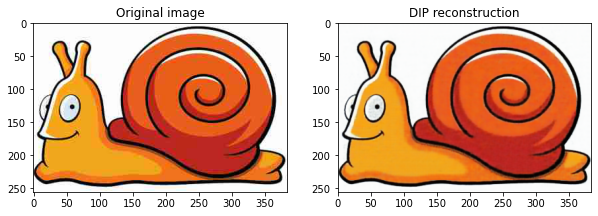

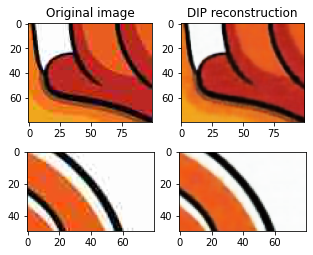

PSNR dip: 29.15794563293457


In [0]:
snail_dip, snail_PSNR, snail_loss = DIP_denoise(snail_img, device, noise_ch=3, max_iter=2200, alpha=0.99, verbose=False, freq=500)

snail_print(snail_img, snail_dip, snail_PSNR)

Now, the image looks much better with no noise, which means that the method did not overfit to the noisy image.

In [0]:
import copy

def DIP_inpainting(image, image_mask, device, noise_ch=32, max_iter=1000, learning_rate=1e-2, sigma_p=1.0/30.0, verbose=False, freq=None, checkpoint=False, perturb=True):
    if verbose and freq is None:
        freq = max(1, max_iter // 10)
    img  = torchvision.transforms.ToTensor()(image).to(torch.float32).unsqueeze(0).to(device)
    mask = torchvision.transforms.ToTensor()(image_mask).to(torch.float32).unsqueeze(0).to(device)

    inpainting_net = UNet(noise_ch, out_channels=3, num_filters=[8,16,32,64,128], activation='leaky_relu')
    inpainting_net.to(device)

    loss_function = nn.MSELoss()
    optimizer = torch.optim.Adam(inpainting_net.parameters(), lr=learning_rate)
    loss_history = []

    # sample noise from U(0, 1/10)
    noise = torch.rand((1, noise_ch, img.size(2), img.size(3)), device=device) * 1.0 / 10.0
    perturbation = noise.clone()
    
    prev_loss, prev_state, checkpoint_it = None, None, 50
    inpainting_net.train()
    i = 0
    while i < max_iter:
        if perturb:
            net_input = noise + (perturbation.normal_() * sigma_p)
        else:
            net_input = noise
        net_out = inpainting_net(net_input)

        optimizer.zero_grad()
        loss = loss_function(img * mask, net_out * mask)
        loss.backward()
        optimizer.step()

        if checkpoint and i > 2000 and i % checkpoint_it == 0:
            prev_state = copy.deepcopy(inpainting_net.state_dict())

        if checkpoint and i > 2000 and loss - prev_loss > 0.002:
            inpainting_net.load_state_dict(prev_state)
            continue

        prev_loss = loss
        loss_history.append(loss.item())

        if verbose and i % freq == 0:
            print("Iteration:", i)
            dip_PIL = torchvision.transforms.ToPILImage()(net_out.detach().squeeze(0).cpu())
            plt.imshow(dip_PIL)
            plt.show()
        
        i += 1

    return net_out.detach().cpu().squeeze(0), loss_history

In [0]:
def inpaint_image(image, mask, device, max_iter, learning_rate=1e-2, verbose=False, freq=None, checkpoint=False, perturb=True):

    inpainted, loss = DIP_inpainting(image, mask, device, max_iter=max_iter, learning_rate=learning_rate, verbose=verbose, freq=freq, checkpoint=checkpoint, perturb=perturb)
    inpainted_PIL = torchvision.transforms.ToPILImage()(inpainted)

    plt.plot(loss)
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.show()

    plt.figure(figsize=(20,16))

    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title("Original image")

    plt.subplot(1, 3, 2)
    plt.imshow(np.array(image) / 255 * np.array(mask)[:,:,None] / 255)
    plt.title("Masked image")

    plt.subplot(1, 3, 3)
    plt.imshow(inpainted_PIL)
    plt.title("Inpainted image")

    plt.show()

Iteration: 0


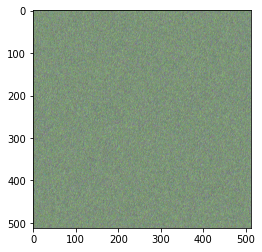

Iteration: 1000


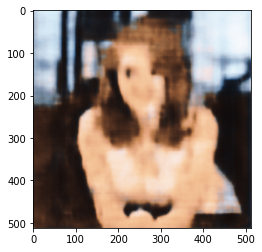

Iteration: 2000


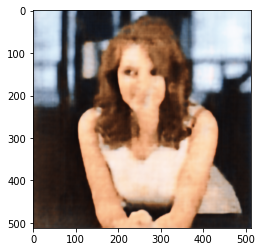

Iteration: 3000


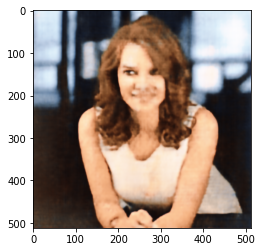

Iteration: 4000


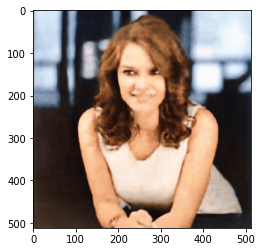

Iteration: 5000


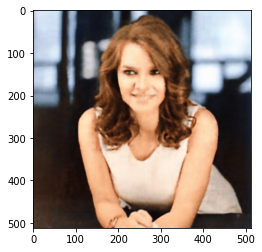

Iteration: 6000


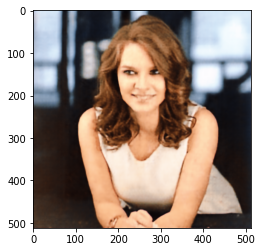

Iteration: 7000


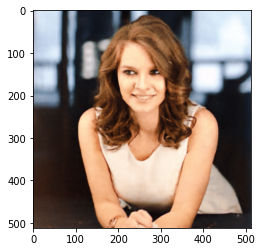

Iteration: 8000


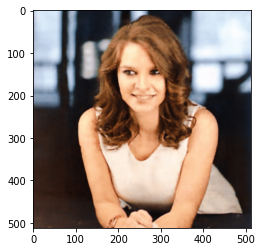

Iteration: 9000


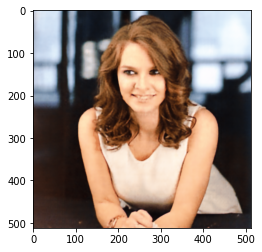

Iteration: 10000


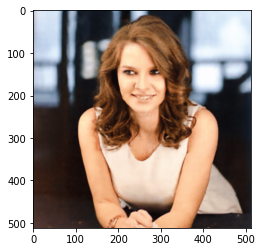

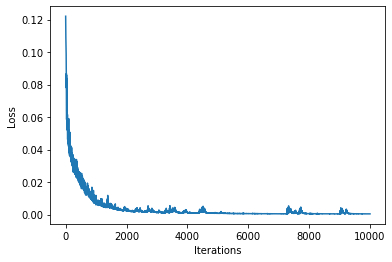

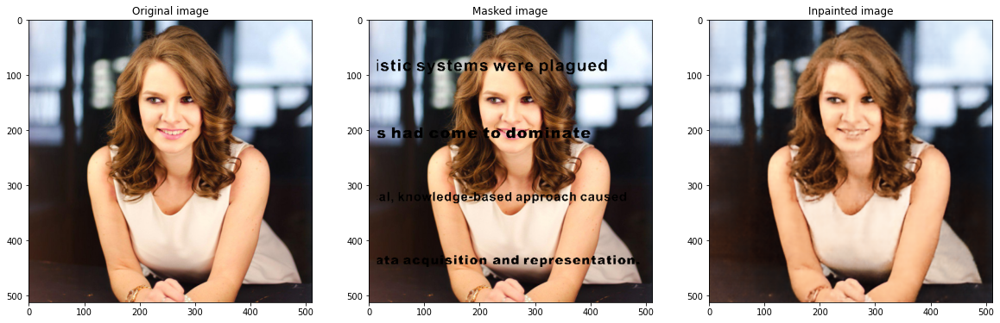

In [0]:
kate = Image.open('./data/inpainting/kate.png')
kate_mask = Image.open('./data/inpainting/kate_mask.png')

kate_inpainted = inpaint_image(kate, kate_mask, device, learning_rate=1e-2, max_iter=10001, verbose=True, freq=1000, checkpoint=True, perturb=True)

For this image, loss had a lot of destabilizing spikes after which the image quality degraded significantly. In order to combat this issue, checkpointing was implemented as was suggested in the paper. This improved the results and it can be seen that the text was removed, but overall quality of the picture is not that great, despite 10000 iterations and we can see that increasing the number of iterations would most likely not lead to better results, because the picture almost stops changing after 7000 iterations and even degrades a bit.<br>

Another idea was to remove the additional perturbation at each step (which was suggested in the original paper as it seemed to improve the results and stability) and see what happens, the number of iterations was set to a lesser value, because without perturbations, the model should be able to fit the picture far quicker.

Iteration: 0


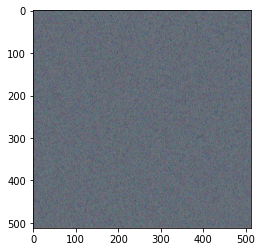

Iteration: 500


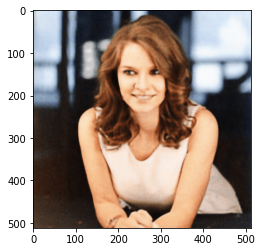

Iteration: 1000


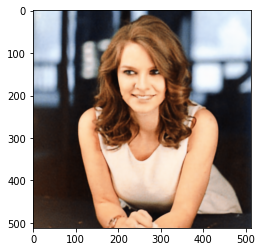

Iteration: 1500


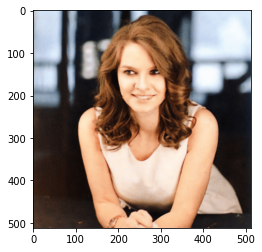

Iteration: 2000


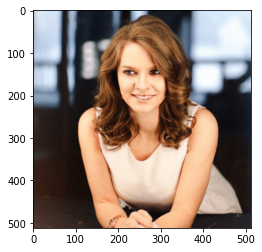

Iteration: 2500


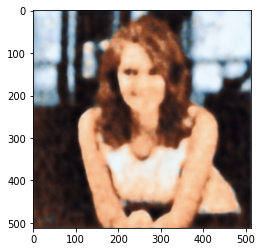

Iteration: 3000


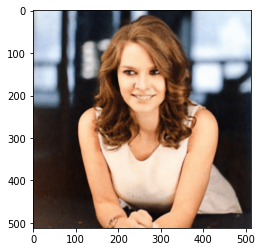

Iteration: 3500


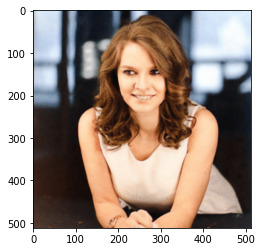

Iteration: 4000


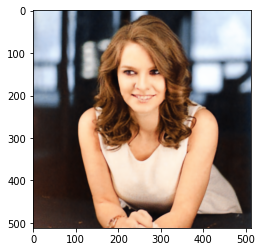

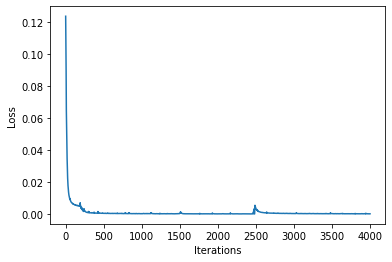

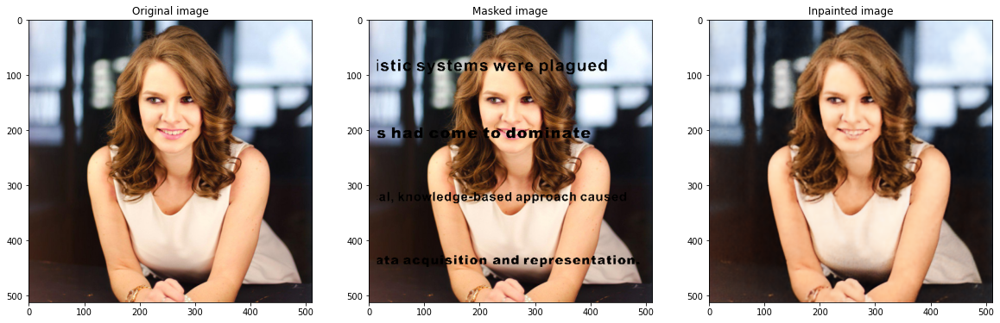

In [0]:
kate_inpainted = inpaint_image(kate, kate_mask, device, learning_rate=1e-2, max_iter=4001, verbose=True, freq=500, checkpoint=True, perturb=False)

As can be seen in the picture above, a far better quality was obtained with smaller number of iterations. Try with a larger number of iterations, maybe the quality can be improved even more.

Iteration: 0


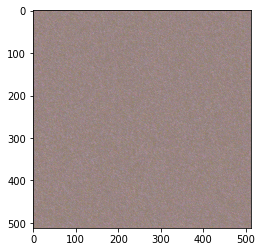

Iteration: 500


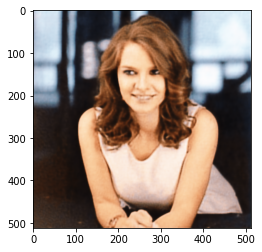

Iteration: 1000


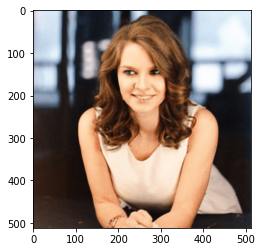

Iteration: 1500


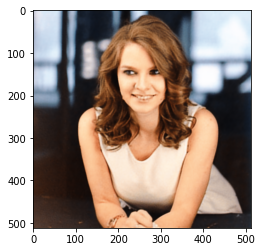

Iteration: 2000


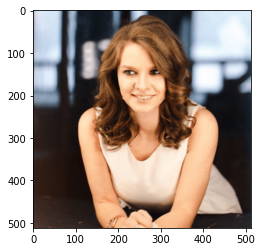

Iteration: 2500


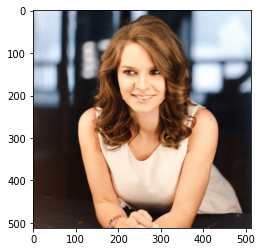

Iteration: 3000


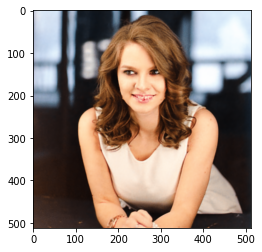

Iteration: 3500


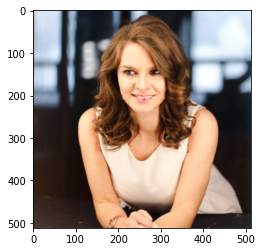

Iteration: 4000


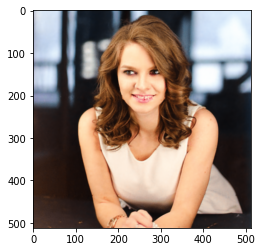

Iteration: 4500


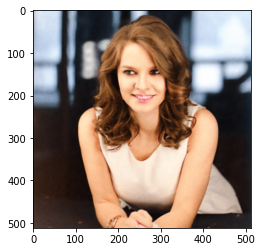

Iteration: 5000


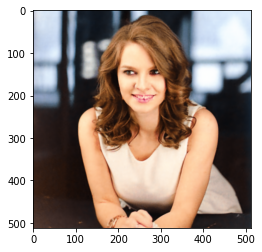

Iteration: 5500


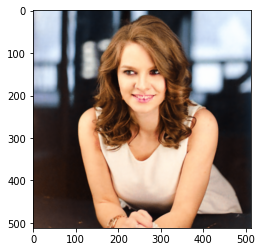

Iteration: 6000


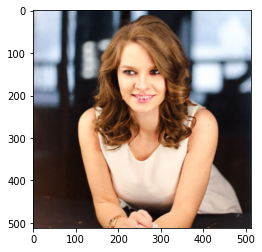

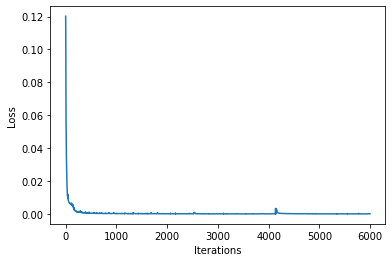

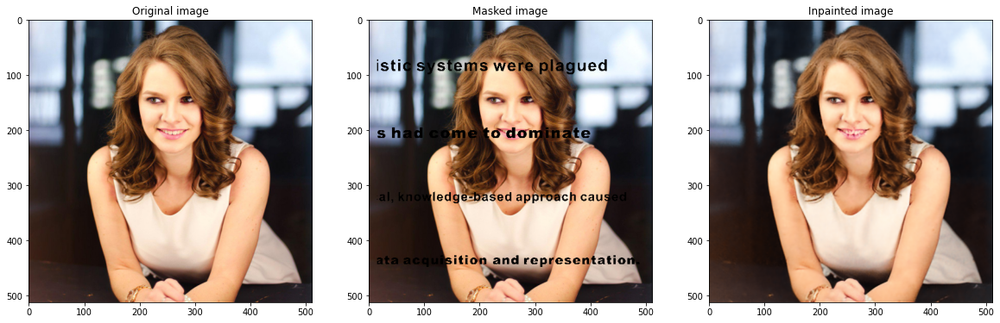

In [0]:
kate_inpainted = inpaint_image(kate, kate_mask, device, learning_rate=1e-2, max_iter=6001, verbose=True, freq=500, checkpoint=True, perturb=False)

We can see that there are observable artifcats in the mouth area, probably the result of overfitting. However, the colors seem to be better. Overall, it seems that $N$ = 4000 is the optimal value there.

Iteration: 0


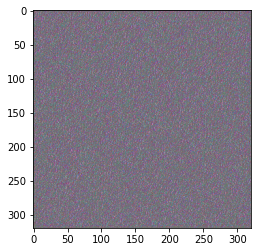

Iteration: 1000


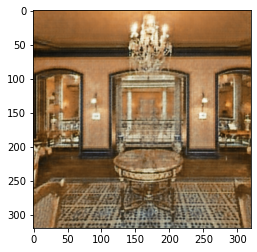

Iteration: 2000


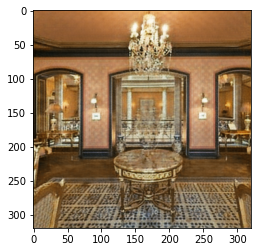

Iteration: 3000


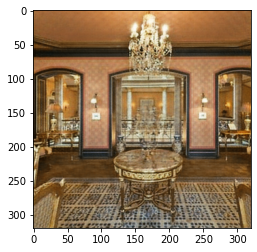

Iteration: 4000


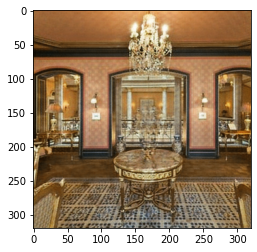

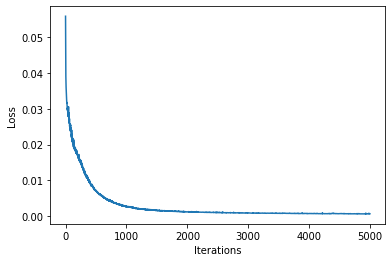

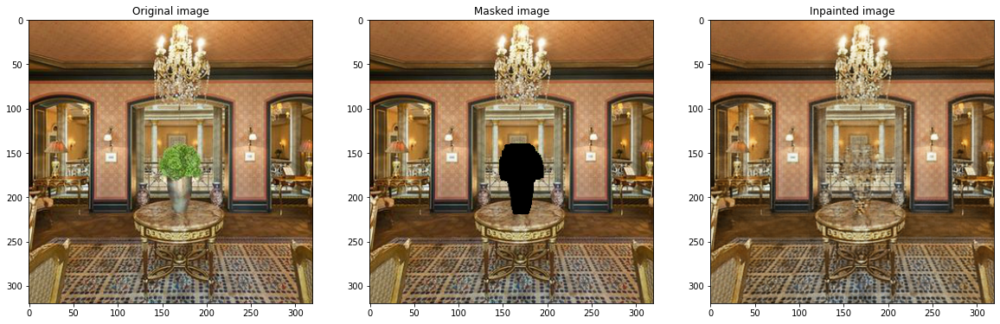

In [0]:
vase = Image.open('./data/inpainting/vase.png')
vase_mask = Image.open('./data/inpainting/vase_mask.png')

vase_inpainted = inpaint_image(vase, vase_mask, device, learning_rate=0.01, max_iter=5000, verbose=True, freq=1000)

As we can see, there is a more or less stable decrease of loss, hence there is no need for checkpointing (no loss spikes). However, the image contains some signs that there might be overfitting involved as vase silhouette is clearly visible. Also, it seems that it becomes more and more pronounced with the higher number of iterations. Since loss slows down after 1000 iterations, we can try lesser number of iterations to see what happens.

Iteration: 0


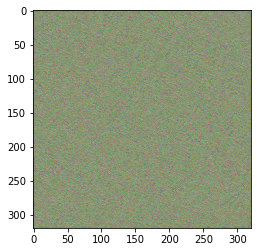

Iteration: 500


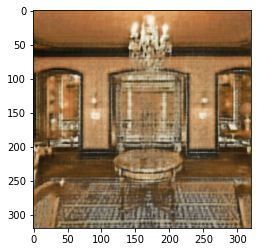

Iteration: 1000


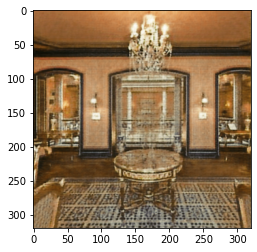

Iteration: 1500


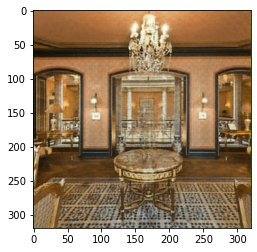

Iteration: 2000


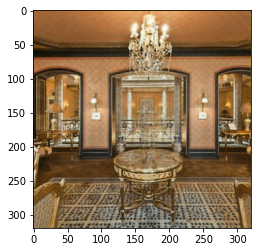

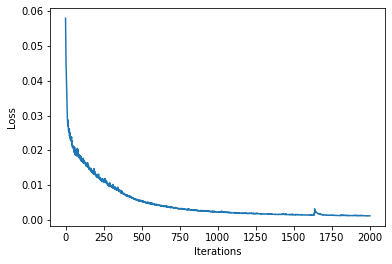

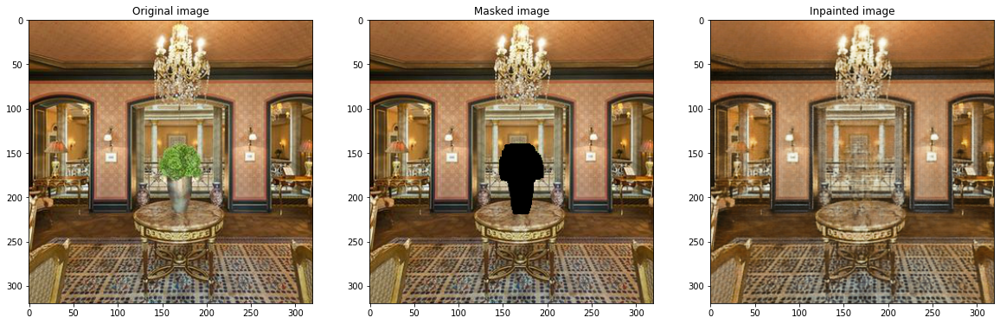

In [0]:
vase_inpainted = inpaint_image(vase, vase_mask, device, learning_rate=0.01, max_iter=2001, verbose=True, freq=500)

We can see that the image looks much clearer, although there is a slight visible silhouette, it is not as pronounced as in the previous case. Lessening number of iterations will lead to worse results, as can be observed by the image history, the images are less sharp in these cases. Hence, it seems that $N$ = 2000 is the best there.

Iteration: 0


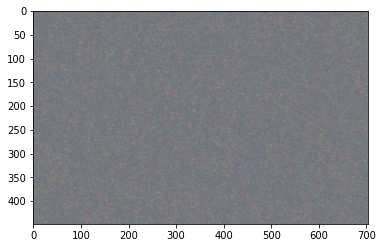

Iteration: 1000


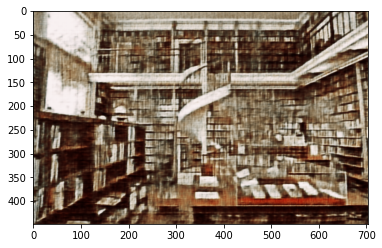

Iteration: 2000


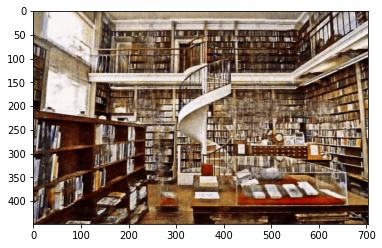

Iteration: 3000


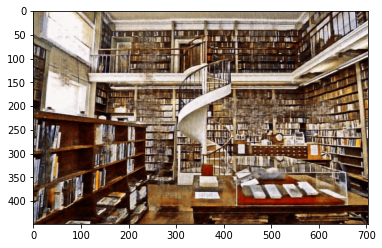

Iteration: 4000


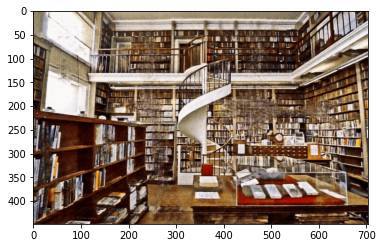

Iteration: 5000


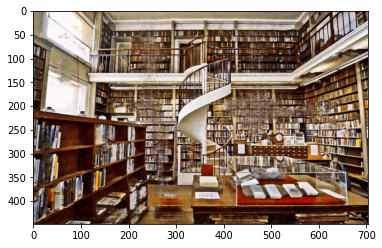

Iteration: 6000


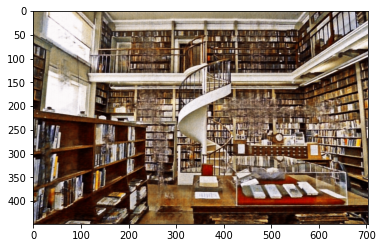

Iteration: 7000


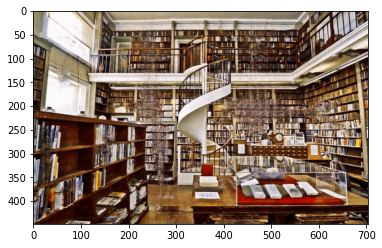

Iteration: 8000


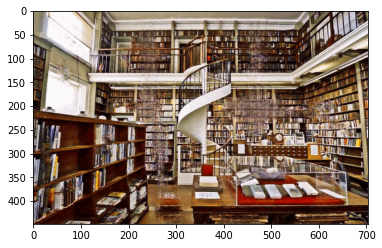

Iteration: 9000


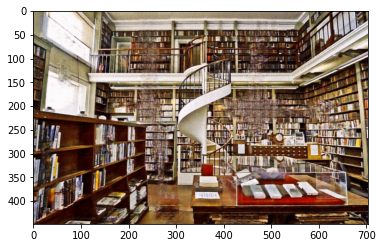

Iteration: 10000


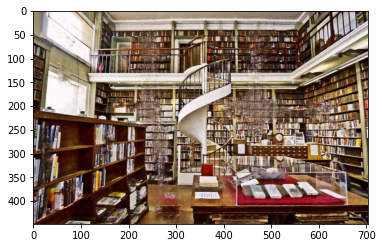

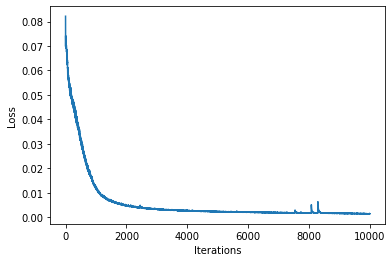

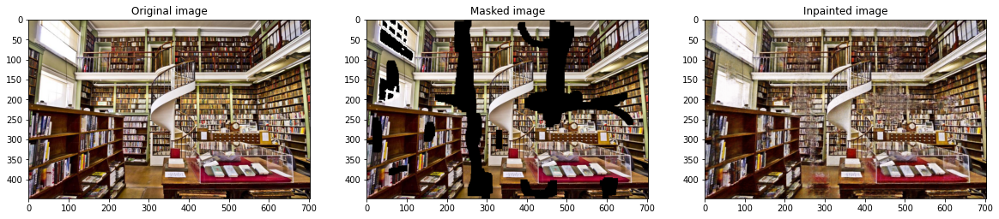

In [0]:
library = Image.open('./data/inpainting/library.png')
library_mask = Image.open('./data/inpainting/library_mask.png')

library_inpainted = inpaint_image(library, library_mask, device, learning_rate=0.1, max_iter=10001, verbose=True, freq=1000)

Loss decreases well with no spikes, hence checkpointing was turned off. But, it can be observed that since 2000 iterations the loss barely changes and pictures starting from 3000 iterations almost stop changing, the only difference is the blur that becomes more or less pronounced (it does not decrease with the number of iterations, but kind of oscilltates). Let's try with a smaller number of iterations, maybe it is the result of overfitting.

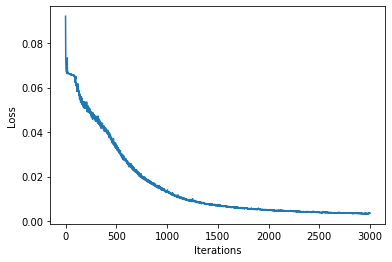

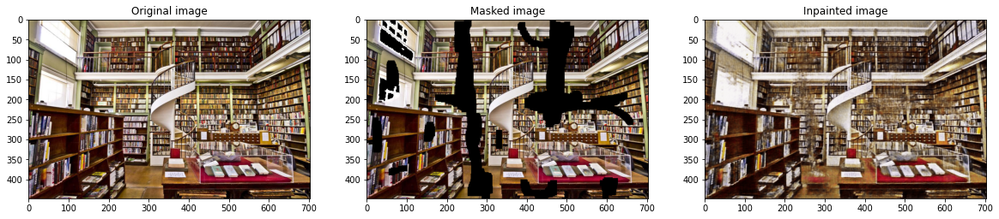

In [0]:
library_inpainted = inpaint_image(library, library_mask, device, learning_rate=0.1, max_iter=3000)

There is almost no difference with the previous case in the end image, so it seems to be better to use lesser number of iterations, in this case $N$ = 3000. It should be also noted, that this result looks better than the one in the original paper with UNet, as the artifacts are less pronounced. Maybe it is due to the fact that we are using a network with less filters.

# Part 3. Variational Autoencoder (VAE) — 15 points

Useful links: 
* Original paper http://arxiv.org/abs/1312.6114
* Helpful videos explaining the topic 
   * https://www.youtube.com/watch?v=P78QYjWh5sM     
   * http://videolectures.net/deeplearning2015_courville_autoencoder_extension/?q=aaron%20courville

In this homework we will train an autoencoder to model images of faces. For this we take "Labeled Faces in the Wild" dataset (LFW) (http://vis-www.cs.umass.edu/lfw/), deep funneled version of it. (frontal view of all faces)


### Prepare the data

In [0]:
import numpy as np
import torch
from torch import nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data_utils
import matplotlib.pyplot as plt
%matplotlib inline

device = device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

In [0]:
!wget https://raw.githubusercontent.com/yandexdataschool/Practical_DL/hw3_19/homework03/lfw_dataset.py -O lfw_dataset.py

--2020-05-12 16:06:46--  https://raw.githubusercontent.com/yandexdataschool/Practical_DL/hw3_19/homework03/lfw_dataset.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2734 (2.7K) [text/plain]
Saving to: ‘lfw_dataset.py’

lfw_dataset.py      100%[===================>]   2.67K  --.-KB/s    in 0s      

2020-05-12 16:06:46 (58.1 MB/s) - ‘lfw_dataset.py’ saved [2734/2734]



In [0]:
#@title Utility functions
import numpy as np
import os
import skimage.io
import skimage
import skimage.transform
import pandas as pd

def fetch_lfw_dataset(attrs_name = "lfw_attributes.txt",
                      images_name = "lfw-deepfunneled",
                      raw_images_name = "lfw",
                      use_raw=False,
                      dx=80,dy=80,
                      dimx=45,dimy=45
    ): # sad smile

    #download if not exists
    if (not use_raw) and not os.path.exists(images_name):
        print("images not found, donwloading...")
        os.system("wget http://vis-www.cs.umass.edu/lfw/lfw-deepfunneled.tgz -O tmp.tgz")
        print("extracting...")
        os.system("tar xvzf tmp.tgz && rm tmp.tgz")
        print("done")
        assert os.path.exists(images_name)
    
    if use_raw and not os.path.exists(raw_images_name):
        print("images not found, donwloading...")
        os.system("wget http://vis-www.cs.umass.edu/lfw/lfw.tgz -O tmp.tgz")
        print("extracting...")
        os.system("tar xvzf tmp.tgz && rm tmp.tgz")
        print("done")
        assert os.path.exists(raw_images_name)

    if not os.path.exists(attrs_name):
        print("attributes not found, downloading...")
        os.system("wget http://www.cs.columbia.edu/CAVE/databases/pubfig/download/%s" % attrs_name)
        print("done")

    #read attrs
    df_attrs = pd.read_csv("lfw_attributes.txt",sep='\t',skiprows=1,) 
    df_attrs = pd.DataFrame(df_attrs.iloc[:,:-1].values, columns = df_attrs.columns[1:])


    #read photos
    dirname = raw_images_name if use_raw else images_name
    photo_ids = []
    for dirpath, dirnames, filenames in os.walk(dirname):
        for fname in filenames:
            if fname.endswith(".jpg"):
                fpath = os.path.join(dirpath,fname)
                photo_id = fname[:-4].replace('_',' ').split()
                person_id = ' '.join(photo_id[:-1])
                photo_number = int(photo_id[-1])
                photo_ids.append({'person':person_id,'imagenum':photo_number,'photo_path':fpath})

    photo_ids = pd.DataFrame(photo_ids)

    #mass-merge
    #(photos now have same order as attributes)
    df_attrs['imagenum'] = df_attrs['imagenum'].astype(np.int64)
    df = pd.merge(df_attrs, photo_ids, on=('person','imagenum'))

    assert len(df)==len(df_attrs),"lost some data when merging dataframes"

    #image preprocessing
    all_photos = df['photo_path'].apply(lambda img: skimage.io.imread(img))\
                                 .apply(lambda img:img[dy:-dy,dx:-dx])\
                                 .apply(lambda img: skimage.img_as_ubyte(skimage.transform.resize(img,[dimx,dimy])))

    all_photos = np.stack(all_photos.values).astype('uint8')
    all_attrs = df.drop(["photo_path","person","imagenum"],axis=1)
    
    return all_photos,all_attrs

In [0]:
data, attrs = fetch_lfw_dataset(dimx=36,dimy=36)

images not found, donwloading...
extracting...
done
attributes not found, downloading...
done


In [0]:
data = data/255
np.savez("real.npz", Pictures=data.reshape(data.shape[0], 36*36*3))

In [0]:
X_train = data[:10000].reshape((10000, -1))
print(X_train.shape)
X_val = data[10000:].reshape((-1, X_train.shape[1]))
print(X_val.shape)

image_h = data.shape[1]
image_w = data.shape[2]

(10000, 3888)
(3143, 3888)


For simplicity we want all values of the data to lie in the interval $[0,1]$:

In [0]:
X_train = np.float32(X_train)
X_val = np.float32(X_val)

In [0]:
def plot_gallery(images, h, w, n_row=3, n_col=6):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.5 * n_col, 1.7 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].reshape((h, w, 3)), cmap=plt.cm.gray, vmin=-1, vmax=1, interpolation='nearest')
        plt.xticks(())
        plt.yticks(())

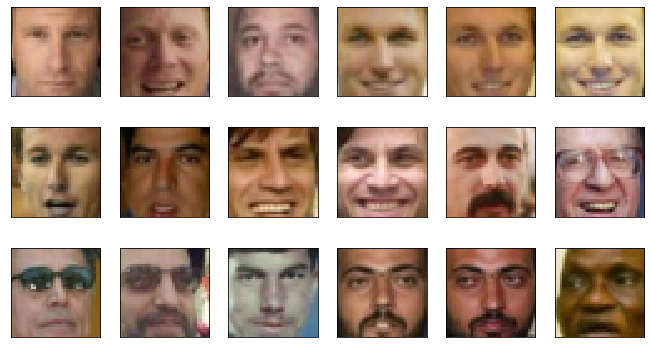

In [0]:
plot_gallery(X_train, image_h, image_w)

In [0]:
train = data_utils.TensorDataset(torch.Tensor(X_train), torch.zeros(X_train.shape[0],)) # pseudo labels needed to define TensorDataset
train_loader = data_utils.DataLoader(train, batch_size=100, shuffle=True)

val = data_utils.TensorDataset(torch.Tensor(X_val), torch.zeros(X_val.shape[0],))
val_loader = data_utils.DataLoader(val, batch_size=100, shuffle=False) # increased batch size, because training was too slow

## Autoencoder

Why to use all this complicated formulas and regularizations, what is the need for variational inference? To analyze the difference, let's first train just an autoencoder on the data:

<img src="https://lilianweng.github.io/lil-log/assets/images/autoencoder-architecture.png" alt="Autoencoder">

In [0]:
dimZ = 100 # Considering face reconstruction task, which size of representation seems reasonable?

# Define the decoder and encoder as networks with one hidden fc-layer
# (that means you will have 2 fc layers in each net)
# Use ReLU for hidden layers' activations
# GlorotUniform initialization for W
# Zero initialization for biases
# It's also convenient to put sigmoid activation on output layer to get nice normalized pics

class Autoencoder(nn.Module):
    def __init__(self, input_features, hidden_size):
        super(Autoencoder, self).__init__()
        
        self.encoder = nn.Sequential( 
                                     nn.Linear(input_features, 1000),
                                     nn.BatchNorm1d(1000),
                                     nn.ReLU(),
                                     nn.Linear(1000, hidden_size),
                                     nn.BatchNorm1d(hidden_size),
                                    )
        self.decoder = nn.Sequential( 
                                     nn.Linear(hidden_size, 1000),
                                     nn.BatchNorm1d(1000),
                                     nn.ReLU(),
                                     nn.Linear(1000, input_features),
                                     nn.BatchNorm1d(input_features),
                                     nn.Sigmoid()
                                    )
        
        # init weights
        self.encoder.apply(self.init_weights)
        self.decoder.apply(self.init_weights)
        
    
    def init_weights(self, m):
        """
        https://discuss.pytorch.org/t/how-are-layer-weights-and-biases-initialized-by-default/13073/3
        """
        if isinstance(m, nn.Linear):
            torch.nn.init.xavier_uniform_(m.weight)
            m.bias.data.fill_(0)
        
    def forward(self, x):
        
        latent_code = self.encoder(x)
        reconstruction = self.decoder(latent_code)
        
        return reconstruction, latent_code

In [0]:
# Create MSE loss function
criterion = torch.nn.MSELoss()

autoencoder = Autoencoder(image_h*image_w*3, dimZ).to(device)

# Use Adam optimizer
optimizer = optim.Adam(autoencoder.parameters())

In [0]:
# Train your autoencoder
# Visualize progress in reconstruction and loss decay
import time

def train(net, n_epochs, criterion, optimizer, train_loader, val_loader, image_dims, device, verbose=True):
    train_history, val_history, image_history = [], [], []

    start = time.time()
    for epoch in range(1, n_epochs+1):
        train_loss, val_loss = 0.0, 0.0
        net.train()
        for X, _ in train_loader:
            X = X.to(device)

            rec, _ = net(X)
            loss = criterion(X, rec)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            del loss
        train_loss /= len(train_loader)
        train_history.append(train_loss)

        net.eval()
        for X, _ in val_loader:
            X = X.to(device)
            rec, _ = net(X)
            val_loss += criterion(X, rec).item()
        val_loss /= len(val_loader)
        val_history.append(val_loss)

        if epoch % 5 == 0:
            image_history.append(rec[0])

    print("Elapsed time:", time.time() - start, "s")
    if verbose:
        plt.plot(range(1, n_epochs+1), train_history, c='b', label='training loss')
        plt.plot(range(1, n_epochs+1), val_history, c='r', label='validation loss')
        plt.xlabel("Epoch")
        plt.ylabel("Loss")
        plt.title("Loss history")
        plt.legend()
        plt.show()

        plt.figure(figsize=(10, 12))
        history_len = len(image_history)

        num_subplots = int(np.ceil(np.sqrt(history_len)))
        n_rows, n_cols = num_subplots, num_subplots
        for i in range(history_len):
            plt.subplots_adjust(bottom=0.0, left=.1, right=.9, top=.50, hspace=.15)
            plt.subplot(n_rows, n_cols, n_cols * (i // n_cols) + i % n_cols + 1)
            plt.imshow(image_history[i].clamp(0,1).data.cpu().numpy().reshape(image_dims[0], image_dims[1], 3))
            plt.title('Epoch = {}'.format((i+1) * n_cols))
            plt.axis('off')
        plt.tight_layout()

    return image_history

Elapsed time: 56.917804479599 s


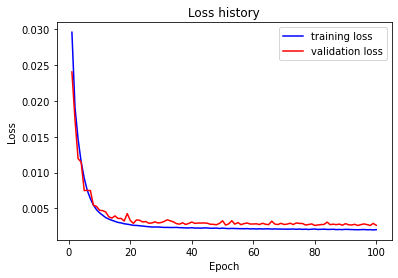

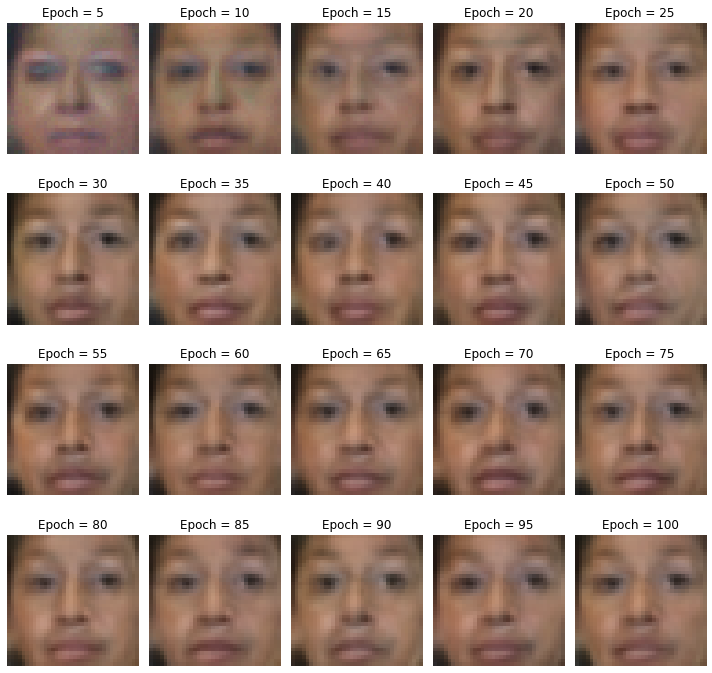

In [0]:
image_progress = train(autoencoder, 100, criterion, optimizer, train_loader, val_loader, (image_w, image_h), device, verbose=True)

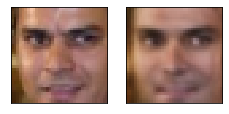

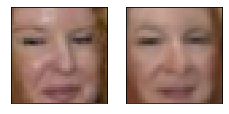

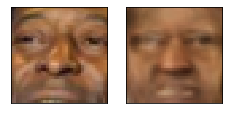

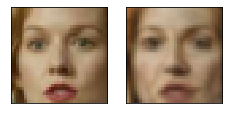

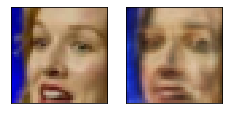

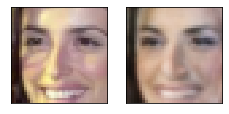

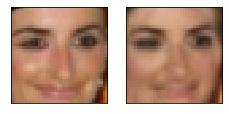

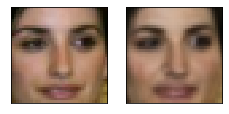

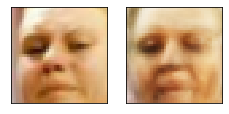

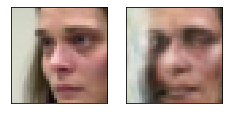

In [0]:
val_loader = data_utils.DataLoader(val, batch_size=1, shuffle=False)

# Examine the reconstructions
for j, data in enumerate(val_loader, 0):
    inp = data[0].cuda()
    pred, _ = autoencoder(inp)
    plot_gallery([data[0].numpy(), pred.data.cpu().numpy()], image_h, image_w, n_row=1, n_col=2)
    if (j >= 9):
        break

Reconstruction is not bad, right? 

## Sampling

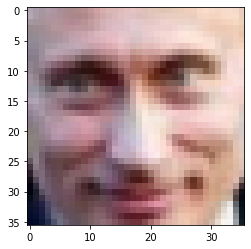

In [0]:
for i, (putin, y) in enumerate(val_loader):
    if i == 2754:
        break
plt.imshow(putin.numpy().reshape((image_w, image_w, 3)))

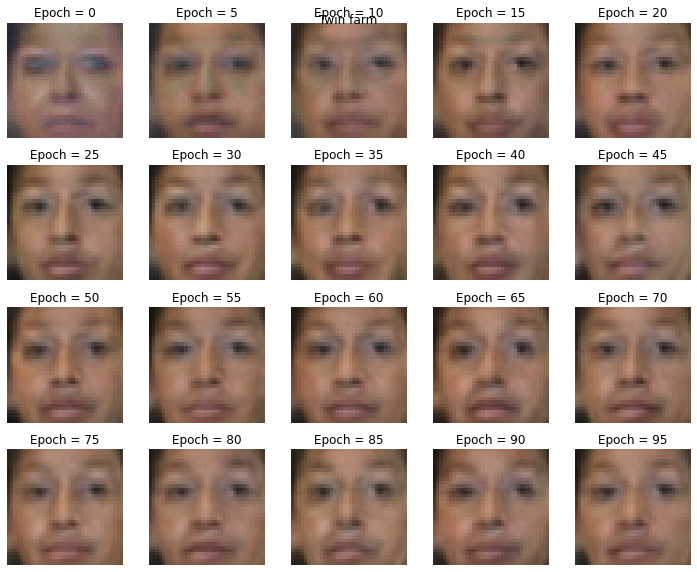

In [0]:
plt.figure(figsize=(10, 12))
plt.suptitle('Twin farm')
for i in range(len(image_progress[:20])):
    plt.subplots_adjust(bottom=0.0, left=.1, right=.9, top=.50, hspace=.15)
    plt.subplot(6, 5, 5*(i//5) + i % 5 + 1)
    plt.imshow(image_progress[i].clamp(0,1).data.cpu().numpy().reshape(image_w, image_h, 3))
    plt.title('Epoch = {}'.format(i * 5))
    plt.axis('off')
plt.tight_layout()

Let's now sample several latent vectors and perform inference from $z$, reconstruct an image given some random $z$ representations.

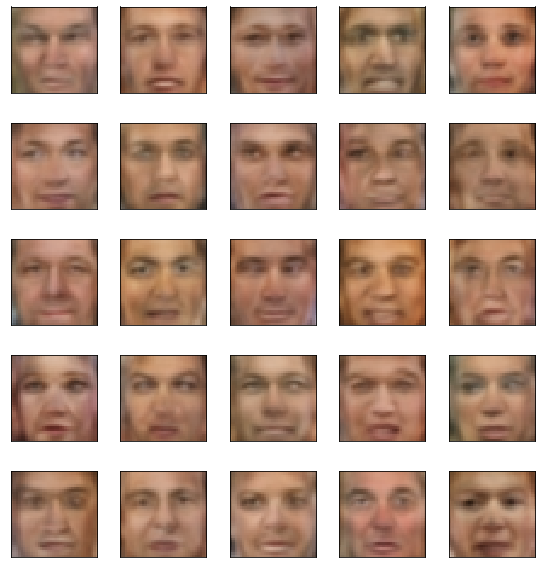

In [0]:
z = (np.random.randn(25, dimZ)*0.5).astype('float32')
output = autoencoder.decoder(torch.from_numpy(z).cuda()).clamp(0, 1)
plot_gallery(output.data.cpu().numpy(), image_h, image_w, n_row=5, n_col=5)

So, if we sample $z$ from normal, whould we eventually generate all possible faces? What do you think?

**Answer**: I think no, we cannot generate all possible faces, because there can be more features that did not get into the training dataset, hence the model won't be able to generate faces with them. There also might be loss of some feature information during the contraction in the encoder. Another concern is a problem of non-variational autoencoders in that their latent space is not necessarily continuous and when you sample from these discontinuities, then it results in generation of highly unrealistic results.

## Variational Autoencoder

Bayesian approach in deep learning considers everything in terms of distributions. Now our encoder generates not just a vector $z$ but posterior ditribution $q(z|x)$. In our case distribution $q$ is Gaussian distibution $N(\mu, \sigma)$ with parameters $\mu$, $\sigma$. Technically, the first difference is that you need to split bottleneck layer in two. One dense layer will generate vector $\mu$, and another will generate vector $\sigma$. Reparametrization trick should be implemented using the **gaussian_sampler** layer, that generates random vetor $\epsilon$ and returns $\mu+\sigma\epsilon \sim N(\mu, \sigma)$ .

Since our decoder is also a function that generates distribution, we need to do the same splitting for output layer. When testing the model we will look only on mean values, so one of the output will be actual autoencoder output.

In this homework we only ask for implementation of the simplest version of VAE - one $z$ sample per input. You can consider to sample several outputs from one input and average them.

In [0]:
# to compare with conventional AE, keep these hyperparameters
# or change them for the values that you used before
dimZ = 100

# define the network
# you can start from https://github.com/pytorch/examples/blob/master/vae/main.py
# or Theano-based examples here https://github.com/Lasagne/Recipes/blob/master/examples/variational_autoencoder/variational_autoencoder.py
# and here https://github.com/y0ast/Variational-Autoencoder/blob/master/VAE.py
# but remember that this is not your ground truth since the data is not MNIST

class VAE(nn.Module):
    def __init__(self, input_features, hidden_size):
        super(VAE, self).__init__()
        
        self.fc_enc = nn.Sequential( 
                                    nn.Linear(input_features, 1000),
                                    nn.BatchNorm1d(1000),
                                    nn.ReLU()
                                   )
        self.fc_enc_mu = nn.Sequential( 
                                       nn.Linear(1000, hidden_size)
                                      )
        self.fc_enc_logsigma = nn.Sequential( 
                                             nn.Linear(1000, hidden_size)
                                            )
        
        self.fc_dec = nn.Sequential(
                                    nn.BatchNorm1d(hidden_size),
                                    nn.Linear(hidden_size, 1000),
                                    nn.ReLU()
                                   )
        self.fc_dec_mu = nn.Sequential( 
                                       nn.Linear(1000, input_features),
                                       nn.Sigmoid()
                                      )
        self.fc_dec_logsigma = nn.Linear(1000, input_features)

        # init weights
        self.apply(self.init_weights)

    def init_weights(self, m):
        """
        https://discuss.pytorch.org/t/how-are-layer-weights-and-biases-initialized-by-default/13073/3
        """
        if isinstance(m, nn.Linear):
            torch.nn.init.xavier_uniform_(m.weight, gain=0.1) # loss looks strange with gain=1.0
            m.bias.data.fill_(0)
        
    def encode(self, x):
        h = self.fc_enc(x)
        latent_mu = self.fc_enc_mu(h)
        latent_logsigma = self.fc_enc_logsigma(h)
        return latent_mu, latent_logsigma

    def decode(self, z):
        h = self.fc_dec(z)
        reconstruction_mu = self.fc_dec_mu(h)
        reconstruction_logsigma = self.fc_dec_logsigma(h)
        return reconstruction_mu, reconstruction_logsigma
    
    def gaussian_sampler(self, mu, logsigma):
        if self.training:
            std = logsigma.exp()
            eps = std.data.new(std.size()).normal_()
            return eps.mul(std).add(mu)
        else:
            return mu

    def forward(self, x):
        latent_mu, latent_logsigma = self.encode(x)
        reconstruction_mu, reconstruction_logsigma = self.decode(self.gaussian_sampler(latent_mu, latent_logsigma))
        
        return reconstruction_mu, reconstruction_logsigma, latent_mu, latent_logsigma

And the last, but not least! Place in the code where the most of the formulaes goes to - optimization objective. The objective for VAE has it's own name - variational lowerbound. And as for any lowerbound our intention is to maximize it. Here it is (for one sample $z$ per input $x$):

$$\mathcal{L} = -D_{KL}(q_{\phi}(z|x)||p(z)) + \log p_{\theta}(x|z)$$

Your next task is to implement two functions that compute KL-divergence and the second term - log-likelihood of an output. Here is some necessary math for your convenience:

$$D_{KL} = -\frac{1}{2}\sum_{i=1}^{dimZ}(1+log(\sigma_i^2)-\mu_i^2-\sigma_i^2)$$
$$\log p_{\theta}(x|z) = \sum_{i=1}^{dimX}\log p_{\theta}(x_i|z)=\sum_{i=1}^{dimX} \log \Big( \frac{1}{\sigma_i\sqrt{2\pi}}e^{-\frac{(\mu_i-x)^2}{2\sigma_i^2}} \Big)=...$$

Don't forget in the code that you are using $\log\sigma$ as an input. Explain, why not $\sigma$?

**Answer**: I think that the main reasons are convenience and numerical stability - a more smooth output helps to combat numerical "explosions". We can do this, because $\sigma$ is non-negative.

In [0]:
import math

def KL_divergence(mu, logsigma):
    return -0.5 * (1 + 2 * logsigma - mu**2.0 - logsigma.exp()**2.0).sum(dim=1).mean()

def log_likelihood(x, mu, logsigma):
    return -(logsigma + 0.5 * torch.log(torch.tensor(2 * math.pi)) + 0.5 * (mu - x)**2.0 / logsigma.exp()**2.0).sum(dim=1).mean()

def loss_vae(x, mu_gen, logsigma_gen, mu_z, logsigma_z):
    return KL_divergence(mu_z, logsigma_z) - log_likelihood(x, mu_gen, logsigma_gen)

And train the model:

In [0]:
# train your autoencoder
# visualize progress in reconstruction and loss decay
import time

def train_vae(net, n_epochs, optimizer, train_loader, val_loader, image_dims, device, verbose=True):
    train_history, val_history, image_history = [], [], []

    start = time.time()
    for epoch in range(1, n_epochs+1):
        train_loss, val_loss = 0.0, 0.0

        net.train()
        for X, _ in train_loader:
            X = X.to(device)

            mu_gen, logsigma_gen, mu_z, logsigma_z = net(X)
            loss = loss_vae(X, mu_gen, logsigma_gen, mu_z, logsigma_z)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
        train_loss /= len(train_loader)
        train_history.append(train_loss)

        net.eval()
        for X, _ in val_loader:
            X = X.to(device)

            mu_gen, logsigma_gen, mu_z, logsigma_z = net(X)
            val_loss += loss_vae(X, mu_gen, logsigma_gen, mu_z, logsigma_z).item()
        val_loss /= len(val_loader)
        val_history.append(val_loss)

        if epoch % 5 == 0:
            image_history.append(mu_gen[0])

    print("Elapsed time:", time.time() - start, "s")
    if verbose:
        plt.plot(range(1, n_epochs+1), train_history, c='b', label='training loss')
        plt.plot(range(1, n_epochs+1), val_history, c='r', label='validation loss')
        plt.xlabel("Epoch")
        plt.ylabel("Loss")
        plt.title("Loss history")
        plt.legend()
        plt.show()

        plt.figure(figsize=(10, 12))
        history_len = len(image_history)

        num_subplots = int(np.ceil(np.sqrt(history_len)))
        n_rows, n_cols = num_subplots, num_subplots
        for i in range(history_len):
            plt.subplots_adjust(bottom=0.0, left=.1, right=.9, top=.50, hspace=.15)
            plt.subplot(n_rows, n_cols, n_cols * (i // n_cols) + i % n_cols + 1)
            plt.imshow(image_history[i].clamp(0,1).data.cpu().numpy().reshape(image_dims[0], image_dims[1], 3))
            plt.title('Epoch = {}'.format((i+1) * n_cols))
            plt.axis('off')
        plt.tight_layout()

Elapsed time: 74.21318292617798 s


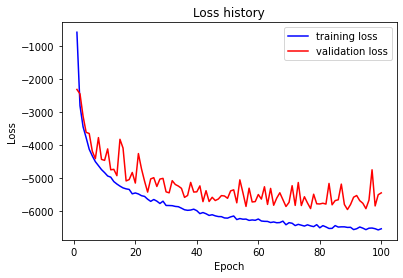

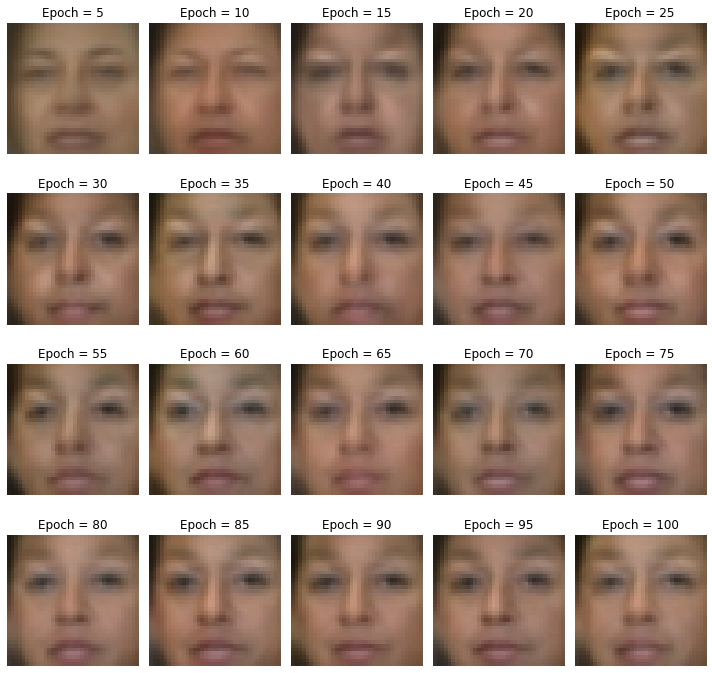

In [0]:
vae = VAE(image_h*image_w*3, dimZ).to(device)

val_loader = data_utils.DataLoader(val, batch_size=100, shuffle=False) # because training is too slow with batch_size=1
optimizer_vae = torch.optim.Adam(vae.parameters())
train_vae(vae, 100, optimizer_vae, train_loader, val_loader, (image_w, image_h), device)

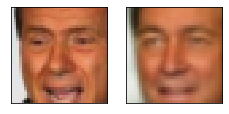

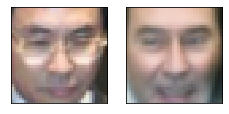

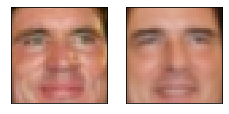

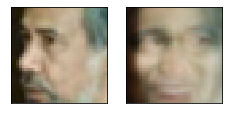

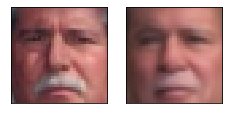

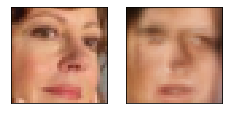

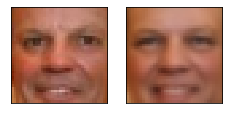

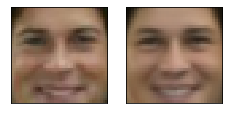

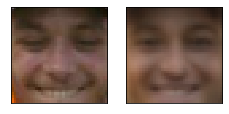

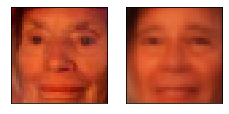

In [0]:
val_loader = data_utils.DataLoader(val, batch_size=1, shuffle=True)
vae.eval()
for j, data in enumerate(val_loader, 0):
    input = data[0].cuda()
    reconstruction_mu, _, _, _ = vae(input)
    plot_gallery([data[0].numpy(), reconstruction_mu.data.cpu().numpy()], image_h, image_w, n_row=1, n_col=2)
    if (j >= 9):
        break

And finally sample from VAE.

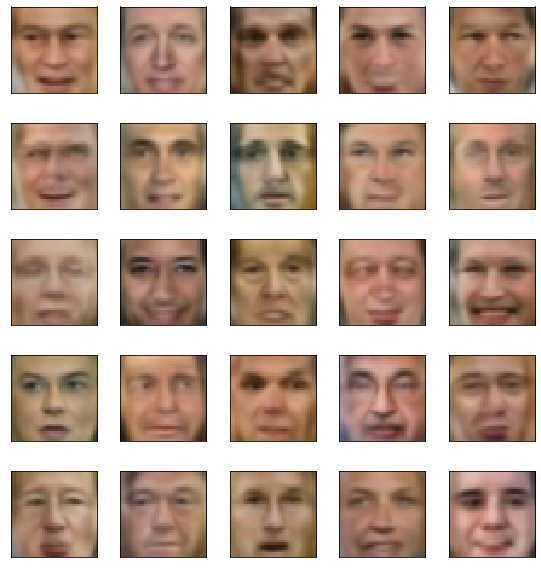

In [0]:
# TODO
# Sample some images from the learned distribution
# 1) Sample z ~ N(0,1)
# 2) Sample from N(decoder_mu(z), decoder_sigma(z))

z = torch.randn(25, dimZ)
output, *_ = vae.decode(z.to(device))
plot_gallery(output.data.cpu().numpy(), image_h, image_w, n_row=5, n_col=5)

Even if in practice you do not see the much difference between AE and VAE, or VAE is even worse, the little bayesian inside you should be jumping for joy right now. 

In VAE you can truly sample from image distribution $p(x)$, while in AE there is no easy and correct way to do it. 

### If you are going to do part 4 (presicion-recall score): 

In [0]:
# using your model, generate face set with len = len(data)
z = torch.randn(len(data), dimZ)
answ, *_ = vae.decode(z.to(device))
answ = answ.cpu().detach().view(-1,36,36,3).numpy()

### Save it ot npz

In [0]:
np.savez("vae.npz", Pictures=answ)

## Congrats! and Bonus

If you managed to tune your autoencoders to converge and learn something about the world, now it's time to make fun out of it. As you may have noticed, there are face attributes in dataset. We're interesting in "Smiling" column, but feel free to try others as well! Here is the first task:

1) Extract the "Smilling" attribute and create a two sets of images: 10 smiling faces and 10 non-smiling ones.

2) Compute latent representations for each image in "smiling" set and average those latent vectors. Do the same for "non-smiling" set. You have found **"vector representation"** of the "smile" and "no smile" attribute.

3) Compute the difference: "smile" vector minus "non-smile" vector.

3) Now check if **"feature arithmetics"** works. Sample a face without smile, encode it and add the diff from p. 3. Check if it works with both AE and VAE. 

In [0]:
data, attrs = fetch_lfw_dataset(dimx=36,dimy=36)

smiling_attr = attrs['Smiling'].values
smiling_rank = smiling_attr.argsort()

smiling_faces = data[smiling_rank[-10:]].reshape(10, -1)
non_smiling_faces = data[smiling_rank[:10]].reshape(10, -1)

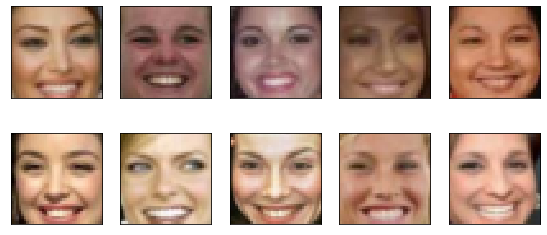

In [0]:
# Smiling faces
plot_gallery(smiling_faces, image_h, image_w, 2, 5)

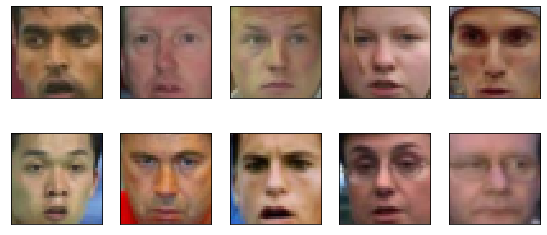

In [0]:
# Non-smiling faces
plot_gallery(non_smiling_faces, image_h, image_w, 2, 5)

In [0]:
# tensors
smiling_tensor = torch.tensor(smiling_faces / 255).to(torch.float32).to(device)
non_smiling_tensor = torch.tensor(non_smiling_faces / 255).to(torch.float32).to(device)

# compute latent representations and average them
smiling_latent_vae = vae.encode(smiling_tensor)[0].mean(dim=0, keepdim=True)
non_smiling_latent_vae = vae.encode(non_smiling_tensor)[0].mean(dim=0, keepdim=True)

# compute difference
diff_vae = smiling_latent_vae - non_smiling_latent_vae

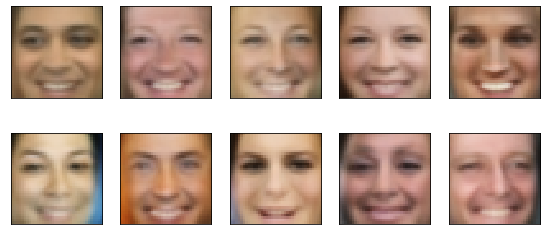

In [0]:
# Try with VAE
encoded_vae, _ = vae.encode(non_smiling_tensor)
decoded_vae, _ = vae.decode(encoded_vae + diff_vae)

plot_gallery(decoded_vae.detach().cpu().numpy(), image_h, image_w, 2, 5)

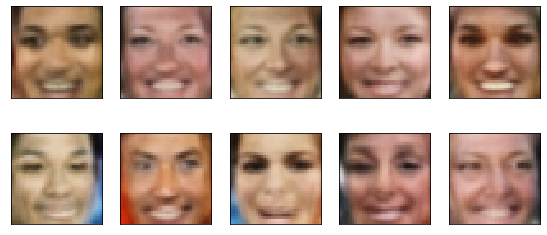

In [0]:
# Try with AE

smiling_latent_ae = autoencoder.encoder(smiling_tensor).mean(dim=0, keepdim=True)
non_smiling_latent_ae = autoencoder.encoder(non_smiling_tensor).mean(dim=0, keepdim=True)

# compute difference
diff_ae = smiling_latent_ae - non_smiling_latent_ae

encoded_ae = autoencoder.encoder(non_smiling_tensor)
decoded_ae = autoencoder.decoder(encoded_ae + diff_ae)

plot_gallery(decoded_ae.detach().cpu().numpy(), image_h, image_w, 2, 5)

# Part 4. Generative Adversarial Networks (GANs) — 15 points

## Links

- https://en.wikipedia.org/wiki/Generative_adversarial_network
- https://towardsdatascience.com/understanding-generative-adversarial-networks-gans-cd6e4651a29

## Theory

### Intro

Now we will consider another implicit generative model.

Implicit models (in contrary to explicit VAE), do not provide a direct access to the modeled data distribution $p(x)$, but only allow to sample from it.

Though this may be an advantage rather than a disadvantage. Most of the explicit models have to make assumptions about the shape of the data distribution. For example, in VAEs the assumption is that each image comes from a normal distribution, with each pixel being _independent_ of each other. Needless to say, this model is far from being ideal for modelling the natural images, because we all know that pixels in the image strongly depend not only on their neighbours, but sometimes on the global context as well.

<img src="https://bit.ly/3567LM6" width=320px>

This is why it is hard for us to believe that the image above is real, even though all local patches are perfectly real :)

### Method description

In order to overcome limitations of tracktable families of probabilistic models, we have to go intractable. Currently, Generative Adversarial Networks is the most successful example of such models.

__Key idea__ of GANs is the use of a loss function that is trained from the data.

A good analogy is a counterfeiter vs a cop example:

<img src="https://www.cfml.se/img/blog/generative_adversarial_networks/counterfeiter_vs_cop.jpg" width=640px>

A counterfeiter is a "generator" neural network that is being trained to produce realistic data points (not neccessarily images). A cop is a "discriminator" neural network trained to recognize fake data points. The counterfeiter gets constant updates from the cop via a gradient flow (backpropagation) and tries to maximize the realism score a cop is assigning to fake data points. The cop receives the feedback via the update of the available dataset, and tries to maximize the recognition accuracy.

If we denote $G$ as a generator, with $\hat{x}$ being its output, $D$ as a discriminator and $\mathcal{L}(s, \hat{s})$ as a classification function (with $s$ denoting class scores) the cop would want to minimize (say, binary cross entropy), then the objective can be written as a zero-sum game (since a classification function is typically symmetric w.r.t. classes): 

$$
    \max_G \min_D \mathcal{L} \big( D(x), D(\hat{x}) \big).
$$

In practice, however, for numerous reasons it is useful to separate this single objective into two, leading to a potentially non-zero sum game:

$$
    \max_G \min_D \mathcal{L}_G \big( D(x), D(\hat{x}) \big) + \mathcal{L}_D ( D(x), D(\hat{x}) \big),
$$

with gradients from the objective $\mathcal{L}_G$ being back-propagated only into the generator, and $\mathcal{L}_D$ — only into the discriminator.

### Training stability

The objective above is typically optimized via an alternating stochastic gradient descend technique: i.e., we first do an optimization step w.r.t. one network, and then use updated weights to perform a step w.r.t. another network. Although this technique has convergence issues [1], it is still widely used for its simplicity and memory efficiency.

Also, although GANs used to be notoriously hard to train, a number of techniques [2, 3] have been developed to overcome the difficulties.

Still, when we are talking about GANs, it is incorrect to use a term "convergence", because even with the aforementioned techniques, the optimization process does not converge to a state when the loss of the generator converges to zero. On contrary, it is a __red flag__ indicating a __training instability__ if this loss converges to zero. In practice, this means that the generator is fooling the discriminator with garbage.

Ideal training curves look like that:

<img src="https://i.ibb.co/0csVDhH/gans-training-curves.png" alt="source: https://deepai.org/publication/geogan-a-conditional-gan-with-reconstruction-and-style-loss-to-generate-standard-layer-of-maps-from-satellite-images" width=640px>

Bad training curves look like that:

<img src="https://miro.medium.com/max/2732/1*4A5bo8gVG9wmg-5wtqavOg.png" width=640px>

The weights of both the generator and discriminator keep constantly updating during training, resulting in a typical oscilation behavior [1].

Usually ideal training curves end up like the bad ones if you train long enough — all you can do is taking a checkpoint right before the training collapses (you can see this point clearly on the second plot). If the training process was stable, this collapse happends long after the results have stopped improving, though some models still struggle to obtain stable enough behavior for data with high dimensionality [4].

## Task

Implement and train a generative adversarial network using the provided dataset in 3 variants:

1. with a spectral normalization,
2. with a gradient penalty,
3. without any regularization.

Also try turning on and off batch normalization in the generator network for all approaches. Note that spectral normalization and batch normalization can be used simultaneously, since SN is only applied to linear and convolutional layers.

Visualize the resulting learning curves for all approaches and provide a side-by-side comparison for a small (~10 items) subset of samples for each method. Your learning curves should look similar to the "ideal" curves above.

## Notes

- Use Adam optimizer with $\beta_1 = 0$ for both the generator and the discriminator.
- Start with the learning rate equal to $1 \cdot 10^{-4}$ for both networks. Increase the learning rate by a factor of 4 for the discriminator, when using spectral normalization.
- Use PyTorch implementation of spectral normalization (__torch.nn.utils.SpectralNorm__). Implement a gradient penalty by hand using the following equations and __torch.autograd.grad__ (pass discriminator outputs to _outputs_, inputs to _inputs_, and ones to grad_outputs, set _retain_graph_ to True):


$$
    \mathcal{L}_\text{GP} = 10 \cdot \mathbb{E}_{x \sim p(x)} (||\nabla_x D(x)||_2 - 1)^2
$$

- Use hinge loss for training, but feel free to experiment with other losses as well for bonus points.

\begin{aligned}
    & \mathcal{L}_D = \mathbb{E}_{x \sim p(x)}\, \text{max}\big( 0, 1 - D(x) \big) + \mathbb{E}_{z \sim p(z)}\, \text{max}\big( 0, 1 + D(G(z)) \big) \\
    & \mathcal{L}_G = - \mathbb{E}_{z \sim p(z)}\, D(G(z))
\end{aligned}

## References

[1] Mescheder et. al., "Which Training Methods for GANs do actually Converge?", ICML 2018, https://arxiv.org/abs/1801.04406

[2] Miyato et. al., "Spectral Normalization for Generative Adversarial Networks", ICLR 2018, https://arxiv.org/abs/1802.05957

[3] Gulrajani et. al., "Improved Training of Wasserstein GANs", NeurIPS 2017, https://arxiv.org/abs/1704.00028

[4] Brock et. al., "Large Scale GAN Training for High Fidelity Natural Image Synthesis", ICLR 2018, https://arxiv.org/abs/1809.11096

In [0]:
#@title Utility functions
import numpy as np
import os
import skimage.io
import skimage
import skimage.transform
import pandas as pd

def fetch_lfw_dataset(attrs_name = "lfw_attributes.txt",
                      images_name = "lfw-deepfunneled",
                      raw_images_name = "lfw",
                      use_raw=False,
                      dx=80,dy=80,
                      dimx=45,dimy=45
    ): # sad smile

    #download if not exists
    if (not use_raw) and not os.path.exists(images_name):
        print("images not found, donwloading...")
        os.system("wget http://vis-www.cs.umass.edu/lfw/lfw-deepfunneled.tgz -O tmp.tgz")
        print("extracting...")
        os.system("tar xvzf tmp.tgz && rm tmp.tgz")
        print("done")
        assert os.path.exists(images_name)
    
    if use_raw and not os.path.exists(raw_images_name):
        print("images not found, donwloading...")
        os.system("wget http://vis-www.cs.umass.edu/lfw/lfw.tgz -O tmp.tgz")
        print("extracting...")
        os.system("tar xvzf tmp.tgz && rm tmp.tgz")
        print("done")
        assert os.path.exists(raw_images_name)

    if not os.path.exists(attrs_name):
        print("attributes not found, downloading...")
        os.system("wget http://www.cs.columbia.edu/CAVE/databases/pubfig/download/%s" % attrs_name)
        print("done")

    #read attrs
    df_attrs = pd.read_csv("lfw_attributes.txt",sep='\t',skiprows=1,) 
    df_attrs = pd.DataFrame(df_attrs.iloc[:,:-1].values, columns = df_attrs.columns[1:])


    #read photos
    dirname = raw_images_name if use_raw else images_name
    photo_ids = []
    for dirpath, dirnames, filenames in os.walk(dirname):
        for fname in filenames:
            if fname.endswith(".jpg"):
                fpath = os.path.join(dirpath,fname)
                photo_id = fname[:-4].replace('_',' ').split()
                person_id = ' '.join(photo_id[:-1])
                photo_number = int(photo_id[-1])
                photo_ids.append({'person':person_id,'imagenum':photo_number,'photo_path':fpath})

    photo_ids = pd.DataFrame(photo_ids)

    #mass-merge
    #(photos now have same order as attributes)
    df_attrs['imagenum'] = df_attrs['imagenum'].astype(np.int64)
    df = pd.merge(df_attrs, photo_ids, on=('person','imagenum'))

    assert len(df)==len(df_attrs),"lost some data when merging dataframes"

    #image preprocessing
    all_photos = df['photo_path'].apply(lambda img: skimage.io.imread(img))\
                                 .apply(lambda img:img[dy:-dy,dx:-dx])\
                                 .apply(lambda img: skimage.img_as_ubyte(skimage.transform.resize(img,[dimx,dimy])))

    all_photos = np.stack(all_photos.values).astype('uint8')
    all_attrs = df.drop(["photo_path","person","imagenum"],axis=1)
    
    return all_photos,all_attrs

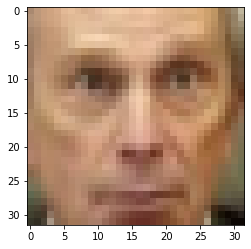

In [2]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
plt.rcParams.update({'axes.titlesize': 'small'})

# The following line fetches you two datasets: images, usable for autoencoder training and attributes.
# Those attributes will be required for the final part of the assignment (applying smiles), so please keep them in mind
data,attrs = fetch_lfw_dataset(dimx=32, dimy=32)

# Preprocess faces
data = np.float32(data).transpose([0, 3, 1, 2]) / 127.5 - 1.0

IMG_SHAPE = data.shape[1:]

# Print random image
plt.imshow(((data[np.random.randint(data.shape[0])] + 1) / 2.0).transpose([1, 2, 0]),
           cmap="gray", interpolation="none")

In [3]:
import torch, torch.nn as nn
import torch.nn.functional as F

use_cuda = torch.cuda.is_available()

print("Torch version:", torch.__version__)
if use_cuda:
    print("Using GPU")
else:
    print("Not using GPU")

Torch version: 1.5.0+cu101
Using GPU


In [0]:
def sample_noise_batch(batch_size):
    noise = torch.randn(batch_size, CODE_SIZE)
    return noise.cuda() if use_cuda else noise.cpu()
    
class Reshape(nn.Module):
    def __init__(self, shape):
        nn.Module.__init__(self)
        self.shape=shape
    def forward(self,input):
        return input.view(self.shape)

### Generator

Example generator architecture is provided below: use it as a reference for you architectures, but feel free to experiment. If your experiments are shown to improve over baseline performance, you will be rewarded with bonus points.

In our realization, please insert batch normalization before nonlinearities.

In [0]:
CODE_SIZE = 256

from itertools import count
# automatic layer name maker. Don't do this in production :)
ix = ('layer_%i'%i for i in count())

generator = nn.Sequential(
    nn.Linear(CODE_SIZE, 256 * 4 * 4),
    Reshape([-1, 256, 4, 4]),
    nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
    nn.LeakyReLU(0.2),
    nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
    nn.LeakyReLU(0.2),
    nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
    nn.LeakyReLU(0.2),
    nn.Conv2d(32, 3, kernel_size=3, padding=1),
    nn.Tanh()
)

if use_cuda: generator.cuda()

In [0]:
generated_data = generator(sample_noise_batch(5))
assert tuple(generated_data.shape)[1:] == IMG_SHAPE, "generator must output an image of shape %s, but instead it produces %s" % (IMG_SHAPE,generated_data.shape)

### Discriminator
Discriminator is your usual convolutional network with interlooping convolution and pooling layers

The network does not include dropout/batchnorm to avoid learning complications.

The convolutional part of the discriminator should mirror the generator (with the exception of the first and the last layers).

In [0]:
def sample_data_batch(batch_size):
    idxs = np.random.choice(np.arange(data.shape[0]), size=batch_size)
    batch = torch.tensor(data[idxs], dtype=torch.float32)
    return batch.cuda() if use_cuda else batch.cpu()

# a special module that converts [batch, channel, w, h] to [batch, units]
class Flatten(nn.Module):
    def forward(self, input):
        return input.view(input.shape[0], -1)

In [0]:
discriminator = nn.Sequential(
    nn.Conv2d(3, 32, kernel_size=3, padding=1),
    nn.LeakyReLU(0.2),
    nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
    nn.LeakyReLU(0.2),
    nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
    nn.LeakyReLU(0.2),
    nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
    nn.Flatten()
)

### YOUR CODE - create convolutional architecture for discriminator
### Note: please start simple. A few convolutions & poolings would do, inception/resnet is an overkill

discriminator.add_module("disc_logit", nn.Linear(256*4*4, 1))

if use_cuda: discriminator.cuda()

In [9]:
discriminator(sample_data_batch(5))

tensor([[0.0168],
        [0.0127],
        [0.0148],
        [0.0181],
        [0.0163]], device='cuda:0', grad_fn=<AddmmBackward>)

In [0]:
class DLossHinge(nn.Module):

    def __init__(self):
        super(DLossHinge, self).__init__()
    
    def forward(self, d_real, d_gen):
        return nn.ReLU()(1.0 - d_real).mean() + nn.ReLU()(1.0 + d_gen).mean()

class GLossHinge(nn.Module):

    def __init__(self):
        super(GLossHinge, self).__init__()
    
    def forward(self, d_gen):
        return -d_gen.mean()

In [0]:
class DLossMiniMax(nn.Module):
    
    def __init__(self):
        super(DLossMiniMax, self).__init__()

    def forward(self, d_real, d_gen):
        return -(nn.LogSigmoid()(d_real).mean() + nn.LogSigmoid()(-d_gen).mean())

class GLossMiniMax(nn.Module):

    def __init__(self):
        super(GLossMiniMax, self).__init__()

    def forward(self, d_gen):
        return -nn.LogSigmoid()(d_gen).mean()

In [0]:
from IPython import display
import time

def train(generator, discriminator, optimizer_G, optimizer_D, criterion_G, criterion_D, n_iterations, batch_size=128, verbose=True, freq=None, gp=False):
    if verbose and freq is None:
        freq = max(1, n_iterations // 10)

    loss_history_D, loss_history_G = [], []

    fixed_noise = sample_noise_batch(10)

    time_start = time.time()
    for i in range(n_iterations):
        # sample batch of images and batch of noise
        image_batch = sample_data_batch(batch_size).requires_grad_()
        noise_batch = sample_noise_batch(batch_size)

        # train discriminator
        discriminator.train()

        image_gen = generator(noise_batch) # generate fake images
        disc_real = discriminator(image_batch) # discriminator on real data
        disc_gen  = discriminator(image_gen) # discriminator on generated data

        disc_loss = criterion_D(disc_real, disc_gen)

        if gp:
            grad = torch.autograd.grad(outputs=disc_real, inputs=image_batch, grad_outputs=torch.ones(disc_real.size()).cuda() if use_cuda else torch.ones(image_batch.size()),
                                       retain_graph=True)[0]
            grad = grad.reshape(batch_size, -1)
            gradient_penalty = (10 * (grad.norm(2, dim=1) - 1) ** 2.0).mean()
            disc_loss += gradient_penalty

        loss_history_D.append(disc_loss.item())
        # optimization step for discriminator
        optimizer_D.zero_grad()
        disc_loss.backward()
        optimizer_D.step()

        # train generator
        generator.train()

        noise_batch = sample_noise_batch(batch_size)
        image_gen = generator(noise_batch)

        gen_loss = criterion_G(discriminator(image_gen))
        loss_history_G.append(gen_loss.item())

        optimizer_G.zero_grad()
        gen_loss.backward()
        optimizer_G.step()

        if verbose and i % freq == 0:
            display.clear_output(wait=True)

            plt.figure(figsize=(15,5))

            plt.subplot(1,2,1)
            plt.plot(loss_history_G)
            plt.title("Generator loss")
            plt.xlabel("Batch number")
            plt.ylabel("G-Loss")
            
            plt.subplot(1,2,2)
            plt.plot(loss_history_D)
            plt.title("Discriminator loss")
            plt.xlabel("Batch number")
            plt.ylabel("D-Loss")

            plt.show()
            
            generator.eval()
            img_gen = generator(fixed_noise)
            imgs = img_gen.detach().cpu().numpy().transpose((0,2,3,1))
            for i in range(10):
                plt.subplot(2,5,i+1)
                plt.imshow(imgs[i], cmap='gray', interpolation="none")
            plt.show()
    print("Elapsed time:", time.time() - time_start, "s")

In [0]:
# Spectral norm + batch norm

generator_bn = nn.Sequential(
    torch.nn.utils.spectral_norm(nn.Linear(CODE_SIZE, 256*4*4)),
    Reshape([-1, 256, 4, 4]),
    torch.nn.utils.spectral_norm(nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1)),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2),
    torch.nn.utils.spectral_norm(nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1)),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2),
    torch.nn.utils.spectral_norm(nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1)),
    nn.BatchNorm2d(32),
    nn.LeakyReLU(0.2),
    torch.nn.utils.spectral_norm(nn.Conv2d(32, 3, kernel_size=3, padding=1)),
    nn.Tanh()
)

discriminator_bn = nn.Sequential(
    torch.nn.utils.spectral_norm(nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1)),
    nn.LeakyReLU(0.2),
    torch.nn.utils.spectral_norm(nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1)),
    nn.LeakyReLU(0.2),
    torch.nn.utils.spectral_norm(nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1)),
    nn.LeakyReLU(0.2),
    torch.nn.utils.spectral_norm(nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1)),
    nn.Sigmoid(),
    nn.Flatten(),
    torch.nn.utils.spectral_norm(nn.Linear(256*4*4, 1))
)

if use_cuda:
    generator_bn.cuda()
    discriminator_bn.cuda()

optimizer_G = torch.optim.Adam(generator_bn.parameters(), lr=1e-4, betas=(0, 0.999))
optimizer_D = torch.optim.Adam(discriminator_bn.parameters(), lr=4e-4, betas=(0, 0.999))

# hinge produces bad results, dunno why
criterion_G = GLossMiniMax()
criterion_D = DLossMiniMax()

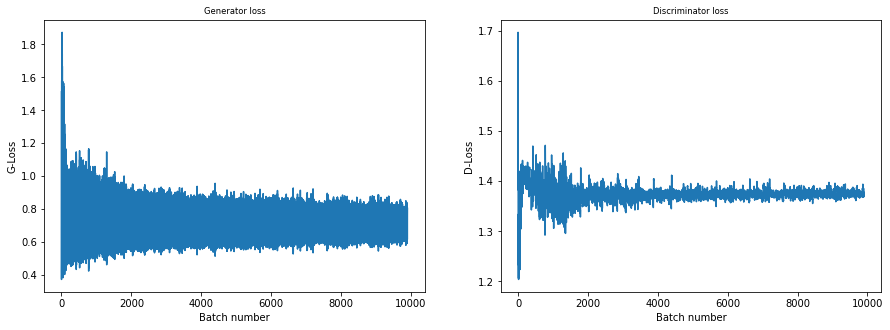

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

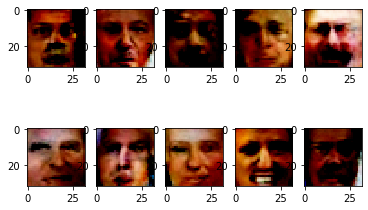

Elapsed time: 1179.8310232162476 s


In [24]:
train(generator_bn, discriminator_bn, optimizer_G, optimizer_D, criterion_G, criterion_D, n_iterations=10000, freq=100)

In [0]:
generator_bn.eval(), discriminator_bn.eval()
test_noise = sample_noise_batch(10)
images_sn_bn = generator_bn(test_noise).detach().cpu().numpy()

In [0]:
# Spectral norm + no batch norm

generator = nn.Sequential(
    torch.nn.utils.spectral_norm(nn.Linear(CODE_SIZE, 256*4*4)),
    Reshape([-1, 256, 4, 4]),
    torch.nn.utils.spectral_norm(nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1)),
    nn.LeakyReLU(0.2),
    torch.nn.utils.spectral_norm(nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1)),
    nn.LeakyReLU(0.2),
    torch.nn.utils.spectral_norm(nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1)),
    nn.LeakyReLU(0.2),
    torch.nn.utils.spectral_norm(nn.Conv2d(32, 3, kernel_size=3, padding=1)),
    nn.Tanh()
)

discriminator = nn.Sequential(
    torch.nn.utils.spectral_norm(nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1)),
    nn.LeakyReLU(0.2),
    torch.nn.utils.spectral_norm(nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1)),
    nn.LeakyReLU(0.2),
    torch.nn.utils.spectral_norm(nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1)),
    nn.LeakyReLU(0.2),
    torch.nn.utils.spectral_norm(nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1)),
    nn.LeakyReLU(0.2),
    nn.Flatten(),
    torch.nn.utils.spectral_norm(nn.Linear(256*4*4, 1))
)

if use_cuda:
    generator.cuda()
    discriminator.cuda()

optimizer_G = torch.optim.Adam(generator.parameters(), lr=1e-4, betas=(0, 0.999))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=4e-4, betas=(0, 0.999))

criterion_G = GLossMiniMax()
criterion_D = DLossMiniMax()

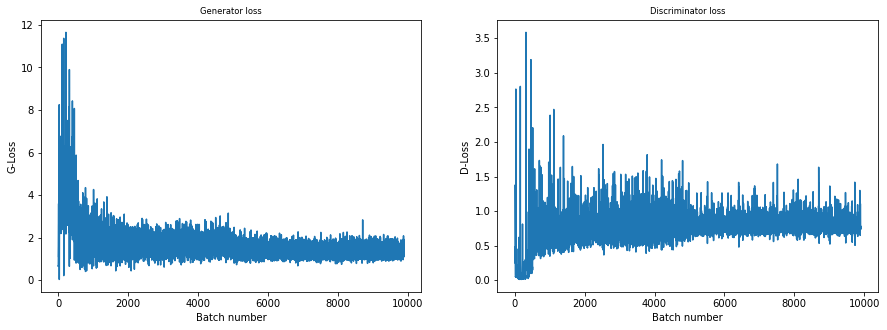

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

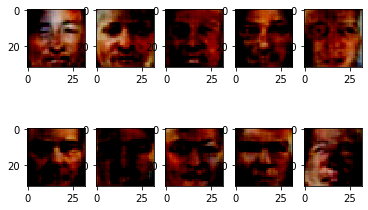

Elapsed time: 1160.1620621681213 s


In [27]:
train(generator, discriminator, optimizer_G, optimizer_D, criterion_G, criterion_D, n_iterations=10000, freq=100)

In [0]:
generator.eval(), discriminator.eval()
images_sn = generator(test_noise).detach().cpu().numpy()

In [0]:
# Gradient penalty + no batch norm

generator = nn.Sequential(
    nn.Linear(CODE_SIZE, 256*4*4),
    Reshape([-1, 256, 4, 4]),
    nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
    nn.LeakyReLU(0.2),
    nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
    nn.LeakyReLU(0.2),
    nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
    nn.LeakyReLU(0.2),
    nn.Conv2d(32, 3, kernel_size=3, padding=1),
    nn.Tanh()
)

discriminator = nn.Sequential(
    nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1),
    nn.LeakyReLU(0.2),
    nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
    nn.LeakyReLU(0.2),
    nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
    nn.LeakyReLU(0.2),
    nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
    nn.LeakyReLU(0.2),
    nn.Flatten(),
    nn.Linear(256*4*4, 1)
)

if use_cuda:
    generator.cuda()
    discriminator.cuda()

optimizer_G = torch.optim.Adam(generator.parameters(), lr=1e-4, betas=(0, 0.999))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=1e-4, betas=(0, 0.999))

criterion_G = GLossMiniMax()
criterion_D = DLossMiniMax()

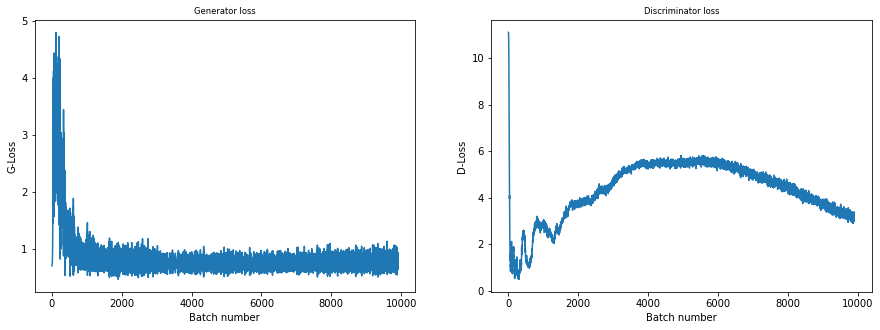

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

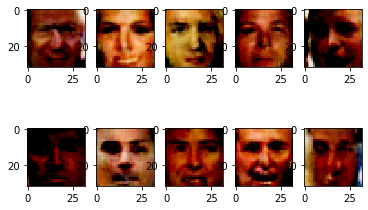

Elapsed time: 1170.9685461521149 s


In [58]:
train(generator, discriminator, optimizer_G, optimizer_D, criterion_G, criterion_D, n_iterations=10000, freq=100, gp=True)

In [0]:
generator.eval(), discriminator.eval()
images_gp = generator(test_noise).detach().cpu().numpy()

In [0]:
# Gradient penalty + batch norm

generator_bn = nn.Sequential(
    nn.Linear(CODE_SIZE, 256*4*4),
    Reshape([-1, 256, 4, 4]),
    nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2),
    nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2),
    nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
    nn.BatchNorm2d(32),
    nn.LeakyReLU(0.2),
    nn.Conv2d(32, 3, kernel_size=3, padding=1),
    nn.Tanh()
)

discriminator_bn = nn.Sequential(
    nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1),
    nn.LeakyReLU(0.2),
    nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
    nn.LeakyReLU(0.2),
    nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
    nn.LeakyReLU(0.2),
    nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
    nn.LeakyReLU(0.2),
    nn.Flatten(),
    nn.Linear(256*4*4, 1)
)

if use_cuda:
    generator_bn.cuda()
    discriminator_bn.cuda()

optimizer_G = torch.optim.Adam(generator_bn.parameters(), lr=1e-4, betas=(0, 0.999))
optimizer_D = torch.optim.Adam(discriminator_bn.parameters(), lr=1e-4, betas=(0, 0.999))

criterion_G = GLossMiniMax()
criterion_D = DLossMiniMax()

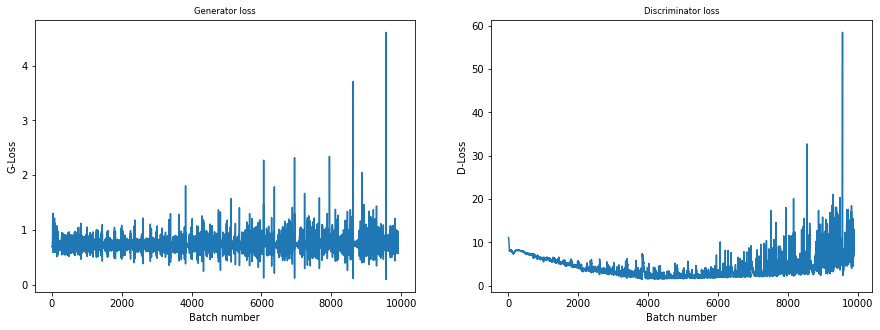

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

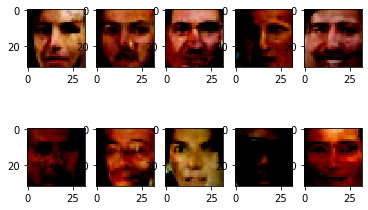

Elapsed time: 1194.7984991073608 s


In [66]:
train(generator_bn, discriminator_bn, optimizer_G, optimizer_D, criterion_G, criterion_D, n_iterations=10000, freq=100, gp=True)

In [0]:
generator_bn.eval(), discriminator_bn.eval()
images_gp_bn = generator_bn(test_noise).detach().cpu().numpy()

In [0]:
# No reg + no batch norm

generator = nn.Sequential(
    nn.Linear(CODE_SIZE, 256*4*4),
    Reshape([-1, 256, 4, 4]),
    nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
    nn.LeakyReLU(0.2),
    nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
    nn.LeakyReLU(0.2),
    nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
    nn.LeakyReLU(0.2),
    nn.Conv2d(32, 3, kernel_size=3, padding=1),
    nn.Tanh()
)

discriminator = nn.Sequential(
    nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1),
    nn.LeakyReLU(0.2),
    nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
    nn.LeakyReLU(0.2),
    nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
    nn.LeakyReLU(0.2),
    nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
    nn.LeakyReLU(0.2),
    nn.Flatten(),
    nn.Linear(256*4*4, 1)
)

if use_cuda:
    generator.cuda()
    discriminator.cuda()

optimizer_G = torch.optim.Adam(generator.parameters(), lr=1e-4, betas=(0, 0.999))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=1e-4, betas=(0, 0.999))

criterion_G = GLossMiniMax()
criterion_D = DLossMiniMax()

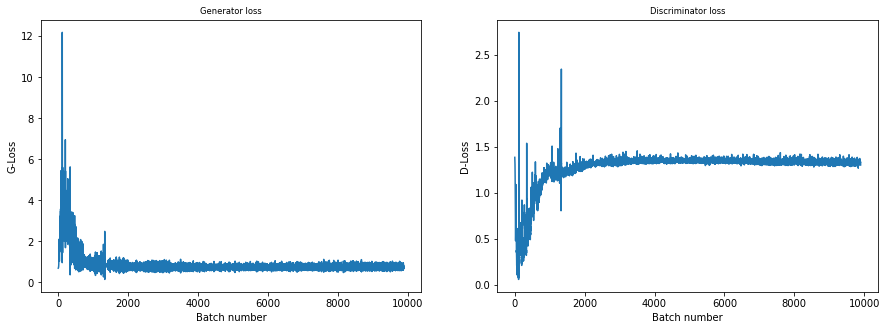

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

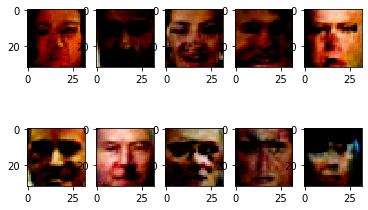

Elapsed time: 1107.6727120876312 s


In [70]:
train(generator, discriminator, optimizer_G, optimizer_D, criterion_G, criterion_D, n_iterations=10000, freq=100)

In [0]:
generator.eval(), generator.eval()
images_nr = generator(test_noise).detach().cpu().numpy()

In [0]:
# Gradient penalty + batch norm

generator_bn = nn.Sequential(
    nn.Linear(CODE_SIZE, 256*4*4),
    Reshape([-1, 256, 4, 4]),
    nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2),
    nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2),
    nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
    nn.BatchNorm2d(32),
    nn.LeakyReLU(0.2),
    nn.Conv2d(32, 3, kernel_size=3, padding=1),
    nn.Tanh()
)

discriminator_bn = nn.Sequential(
    nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1),
    nn.LeakyReLU(0.2),
    nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
    nn.LeakyReLU(0.2),
    nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
    nn.LeakyReLU(0.2),
    nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
    nn.LeakyReLU(0.2),
    nn.Flatten(),
    nn.Linear(256*4*4, 1)
)

if use_cuda:
    generator_bn.cuda()
    discriminator_bn.cuda()

optimizer_G = torch.optim.Adam(generator_bn.parameters(), lr=1e-4, betas=(0, 0.999))
optimizer_D = torch.optim.Adam(discriminator_bn.parameters(), lr=1e-4, betas=(0, 0.999))

criterion_G = GLossMiniMax()
criterion_D = DLossMiniMax()

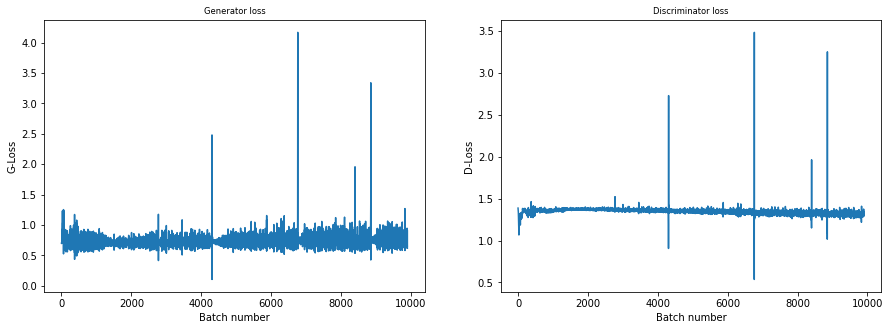

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

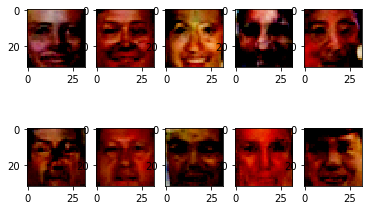

Elapsed time: 1122.78639793396 s


In [75]:
train(generator_bn, discriminator_bn, optimizer_G, optimizer_D, criterion_G, criterion_D, n_iterations=10000, freq=100)

In [0]:
generator_bn.eval(), generator_bn.eval()
images_nr_bn = generator_bn(test_noise).detach().cpu().numpy()

In [0]:
def show_images(imgs, title):
    plt.suptitle(title)
    for i in range(10):
        plt.subplot(2,5,i+1)
        plt.imshow(np.clip(imgs[i].transpose((1,2,0)), 0, 1), cmap='gray', interpolation="none")
    plt.show()

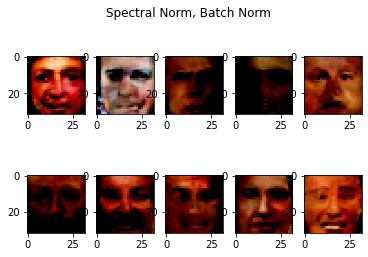

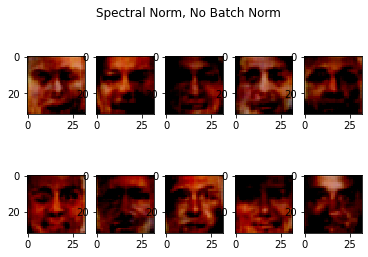

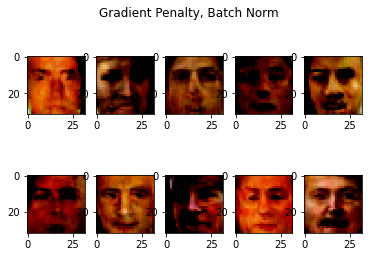

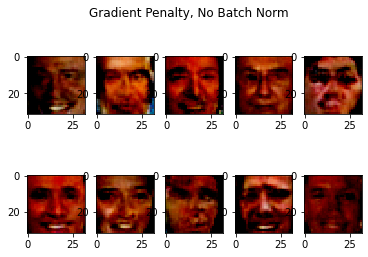

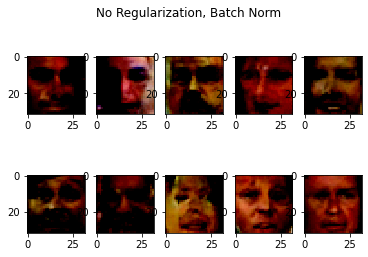

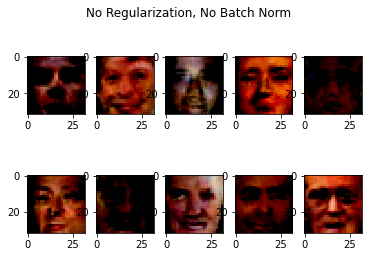

In [85]:
show_images(images_sn_bn, "Spectral Norm, Batch Norm")
show_images(images_sn, "Spectral Norm, No Batch Norm")
show_images(images_gp_bn, "Gradient Penalty, Batch Norm")
show_images(images_gp, "Gradient Penalty, No Batch Norm")
show_images(images_nr_bn, "No Regularization, Batch Norm")
show_images(images_nr, "No Regularization, No Batch Norm")

Subjectively, the pictures with gradient policy look the best and produce the most natural looking faces, while no regularization is the worst. Batch normalization seems to increase the "convergence" - the images look more "developed" with applied batch norm, especially in case of no applied regularization.